# Toy Models of Superposition

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/timaeus-research/devinterp/blob/main/examples/tms.ipynb)

Let's run through an example using Anthropic's toy models of superposition. 

This example is mostly to test that our SGLD estimator is working as expected and to figure out how to integrate this in an SGD setting.

Credits: [Chen et al. (2023)](https://arxiv.org/abs/2310.06301).

## Set-up
### Imports

In [1]:
!pip freeze | grep widgets

In [2]:
!pip install devinterp scipy pyyaml pandas seaborn

Defaulting to user installation because normal site-packages is not writeable
  Obtaining dependency information for devinterp from https://files.pythonhosted.org/packages/ed/cb/ee822127b61d60f0c5e52c4534fc9362f5e9b95ae5aec233e63a103a7c95/devinterp-0.1.0-py3-none-any.whl.metadata
  Using cached devinterp-0.1.0-py3-none-any.whl.metadata (6.6 kB)
  Using cached einops-0.6.1-py3-none-any.whl (42 kB)
  Obtaining dependency information for matplotlib>=3.7.4 from https://files.pythonhosted.org/packages/19/e5/a4ea514515f270224435c69359abb7a3d152ed31b9ee3ba5e63017461945/matplotlib-3.8.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Using cached matplotlib-3.8.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.8 kB)
  Using cached numpy-1.23.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
  Using cached torch-2.0.1-cp310-cp310-manylinux1_x86_64.whl (619.9 MB)
  Using cached nvidia_cuda_cupti_cu11-11.7.101-py3-none-manylinux1_x

In [2]:
import os
from typing import Iterable, Optional, Callable, List, Dict, Any
import pickle
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy.spatial import ConvexHull
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
import tqdm as tq
from tqdm.contrib.concurrent import process_map  # or use tqdm.contrib.concurrent.process_map if available

import itertools
from torch.utils.data import TensorDataset
from torch.nn import functional as F

from devinterp.slt.llc import estimate_learning_coeff_with_summary
from devinterp.optim.sgld import SGLD

class ToyAutoencoder(nn.Module):
    """
    Basic Network class for linear transformation with non-linear activations
    """

    def __init__(
        self,
        input_dim: int,
        hidden_dim: int,
        tied: bool = True,
        final_bias: bool = False,
        hidden_bias: bool = False,
        nonlinearity: Callable = F.relu,
        unit_weights: bool = False,
        standard_magnitude: bool = False,
        initial_scale_factor: float = 1.0,
        initial_bias: Optional[torch.Tensor] = None,
        initial_embed: Optional[torch.Tensor] = None,
    ):
        super().__init__()

        # Set the dimensions and parameters
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.nonlinearity = nonlinearity
        self.tied = tied
        self.final_bias = final_bias
        self.unit_weights = unit_weights
        self.standard_magnitude = standard_magnitude

        # Define the input layer (embedding)
        self.embedding = nn.Linear(self.input_dim, self.hidden_dim, bias=hidden_bias)

        # Set initial embeddings if provided
        if initial_embed is not None:
            self.embedding.weight.data = initial_embed

        # Define the output layer (unembedding)
        self.unembedding = nn.Linear(self.hidden_dim, self.input_dim, bias=final_bias)

        # Set initial bias if provided
        if initial_bias is not None:
            self.unembedding.bias.data = initial_bias

        # If standard magnitude is set, normalize weights and maintain average norm
        if self.standard_magnitude:
            avg_norm = torch.norm(self.embedding.weight.data, p=2, dim=0).mean()
            self.embedding.weight.data = (
                F.normalize(self.embedding.weight.data, p=2, dim=0) * avg_norm
            )

        # If unit weights is set, normalize weights
        if self.unit_weights:
            self.embedding.weight.data = F.normalize(self.embedding.weight.data, p=2, dim=0)

        # Tie the weights of embedding and unembedding layers
        if tied:
            self.unembedding.weight = torch.nn.Parameter(self.embedding.weight.transpose(0, 1))


    def forward(self, x: torch.Tensor):
        """
        Forward pass through the network
        """
        # Apply the same steps for weights as done during initialization
        if self.unit_weights:
            self.embedding.weight.data = F.normalize(self.embedding.weight.data, p=2, dim=0)

        if self.standard_magnitude:
            avg_norm = torch.norm(self.embedding.weight.data, p=2, dim=0).mean()
            self.embedding.weight.data = (
                F.normalize(self.embedding.weight.data, p=2, dim=0) * avg_norm
            )

        if self.tied:
            self.unembedding.weight.data = self.embedding.weight.data.transpose(0, 1)

        x = self.embedding(x)
        x = self.unembedding(x)
        x = self.nonlinearity(x)

        return x

"""
Adapted from [TMS-zoo](https://github.com/JakeMendel/TMS-zoo)
"""

from abc import ABC
from typing import Union

import torch
from torch.utils.data import Dataset


class SyntheticDataset(Dataset, ABC):
    num_samples: int
    num_features: int
    sparsity: Union[float, int]
    # importance: Optional[float]

    def __init__(
        self,
        num_samples,
        num_features,
        sparsity,
        # importance=None
    ):
        """
        Initialize the  object.

        Args:
            num_samples: The number of samples to generate.
            num_features: The dimension of the feature vector.
            sparsity: (float) the probability that a given feature is zero or (int) the number of features that are set to one.
            importance: The importance of the features. If None, then the features are weighted uniformly.
                        Otherwise, the features are weighted by `importance ** (1 + i)`, where `i` is the index of the feature.
        """
        self.num_samples = num_samples  # The number of samples in the dataset
        self.num_features = num_features  # The size of the feature vector for each sample
        self.sparsity = sparsity
        # self.importance = importance
        self.data = self.generate_data()  # Generate the synthetic data

    def generate_values(self):
        raise NotImplementedError

    def generate_mask(self):
        """
        Generate a sparse mask for the given dataset.

        If ``sparsity`` is a float, then the mask is generated by sampling from a Bernoulli distribution with parameter ``1 - sparsity``.
        If ``sparsity`` is an integer, then the mask is generated by sampling exactly ``sparsity`` indices without replacement.

        Args:
            dataset: The dataset to generate the mask for.

        Returns:
            A sparse mask for the given dataset.
        """

        if isinstance(self.sparsity, float):
            return torch.bernoulli(
                torch.ones((self.num_samples, self.num_features)) * (1 - self.sparsity)
            )
        elif isinstance(self.sparsity, int):
            mask = torch.zeros((self.num_samples, self.num_features))
            for i in range(self.num_samples):
                indices = torch.randperm(self.num_features)[: self.sparsity]
                mask[i, indices] = 1

            return mask

        else:
            raise ValueError(
                f"Sparsity must be a float or an integer. Received {type(self.sparsity)}."
            )

    def generate_data(self):
        return self.generate_mask() * self.generate_values()

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        return self.data[idx]


class SyntheticUniformValued(SyntheticDataset):
    """
    This class creates a synthetic dataset where each sample is a vector which has indices which are zero with probability sparsity and uniform between 0 and 1 otherwise
    """

    def generate_values(self):
        return torch.rand((self.num_samples, self.num_features))


class SyntheticBinaryValued(SyntheticDataset):
    """
    This class creates a synthetic dataset where each sample is a vector which has indices which are zero with probability ``sparsity`` and 1 otherwise
    """

    def generate_values(self):
        return 1.0


/tmp/ipykernel_304375/2162266759.py:6: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Environmental variables

In [3]:
torch.manual_seed(1)

DEVICE = os.environ.get(
    "DEVICE",
    "cuda:0"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu",
)
DEVICE = torch.device(DEVICE)
NUM_CORES = int(os.environ.get("NUM_CORES", 1))

### K-gon Plotting Utils

In [4]:
def generate_2d_kgon_vertices(k, rot=0., pad_to=None, force_length=0.9):
    """Set the weights of a 2D k-gon to be the vertices of a regular k-gon."""
    # Angles for the vertices
    theta = np.linspace(0, 2*np.pi, k, endpoint=False) + rot

    # Generate the vertices
    x = np.cos(theta)
    y = np.sin(theta)
    result = np.vstack((x, y))

    if pad_to is not None and k < pad_to:
        num_pad = pad_to - k
        result = np.hstack([result, np.zeros((2, num_pad))])
        
    return (result * force_length)

def generate_init_param(m, n, init_kgon, prior_std=1., no_bias=True, init_zerobias=True, seed=0, force_negb=False, noise=0.01):
    np.random.seed(seed)
    
    if init_kgon is None or m != 2:
        init_W = np.random.normal(size=(m, n)) * prior_std
    else:
        assert init_kgon <= n
        rand_angle = np.random.uniform(0, 2 * np.pi, size=(1,))
        noise = np.random.normal(size=(m, n)) * noise
        init_W = generate_2d_kgon_vertices(init_kgon, rot=rand_angle, pad_to=n) + noise
    
    if no_bias:
        param = {"W": init_W}
    else:
        init_b = np.random.normal(size=(n, 1)) * prior_std
        if force_negb:
            init_b = -np.abs(init_b)
        if init_zerobias:
            init_b = init_b * 0
        param = {
            "W": init_W, 
            "b": init_b
        }
    return param

In [5]:
def plot_polygon(
    W: torch.Tensor,
    b=None,
    ax=None,
    ax_bias=None,
    ax_wnorm=None,
    hull_alpha=0.3,
    dW=None,
    dW_scale=0.3,
    orderb=True,
):
    """Credits: Edmund Lau"""
    if ax is None:
        if W.shape[0] == 2:
            fig, ax = plt.subplots(1, 1)
        elif W.shape[0] == 3:
            fig = plt.figure()
            ax = fig.add_subplot(111, projection="3d")

    if W.shape[0] == 2:  # 2D case
        # Compute the norms of the columns
        norms = np.linalg.norm(W, axis=0)

        # Normalize a copy of the vectors for angle calculations
        W_normalized = W / norms

        # Compute angles from the x-axis for each vector
        angles = np.arctan2(W_normalized[1, :], W_normalized[0, :])

        # Sort the columns of W by angles
        order = np.argsort(angles)
        W_sorted = W[:, order]

        # Plot the origin
        ax.scatter(0, 0, color="red")

        # Plot the vectors
        for i in range(W_sorted.shape[1]):
            ax.quiver(
                0,
                0,
                W_sorted[0, i],
                W_sorted[1, i],
                angles="xy",
                scale_units="xy",
                scale=1,
                width=0.003,
            )
        if dW is not None:
            dW = -dW_scale * dW / np.max(np.linalg.norm(dW, axis=0))
            for col in range(W.shape[1]):
                ax.quiver(
                    W[0, col],
                    W[1, col],
                    dW[0, col],
                    dW[1, col],
                    angles="xy",
                    scale_units="xy",
                    scale=1,
                    color="r",
                    width=0.005,
                )

        # Connect the vectors to form a polygon
        polygon = np.column_stack((W_sorted, W_sorted[:, 0]))
        ax.plot(polygon[0, :], polygon[1, :], alpha=0.5)

        # Plot the convex hull
        hull = ConvexHull(W.T)
        vs = list(hull.vertices) + [hull.vertices[0]]
        ax.plot(W[0, vs], W[1, vs], "r--", alpha=hull_alpha)

        # Set the aspect ratio of the plot to equal to ensure that angles are displayed correctly
        ax.set_aspect("equal", adjustable="box")

    elif W.shape[0] == 3:  # 3D case
        # Plot the origin
        ax.scatter([0], [0], [0], color="red")

        # Plot the vectors
        for i in range(W.shape[1]):
            ax.plot([0, W[0, i]], [0, W[1, i]], [0, W[2, i]], "b-")

        # Plot the convex hull
        hull = ConvexHull(W.T)
        for s in hull.simplices:
            s = np.append(s, s[0])  # Here we cycle back to the first coordinate
            ax.plot(W[0, s], W[1, s], W[2, s], "r--", alpha=hull_alpha)
    else:
        raise ValueError("W must have either 2 or 3 rows")

    if b is not None and ax_bias is not None:
        b_plot = np.ravel(b)
        if orderb:
            b_plot = b_plot[order]
        bar_colors = ["r" if val < 0 else "b" for val in b_plot]
        yticks = np.array(range(1, len(b_plot) + 1))
        ax_bias.barh(
            yticks - 0.4,
            np.abs(b_plot),
            height=0.4,
            color=bar_colors,
            align="edge",
        )
        ax_bias.set_yticks(yticks)
        ax_bias.yaxis.tick_right()
        ax_bias.tick_params(axis="y", labelsize="x-small")
        ax_bias.tick_params(axis="x", labelsize="x-small")

    if ax_wnorm is not None:
        yticks = np.array(range(1, W.shape[1] + 1))
        wnorms = np.linalg.norm(W, axis=0)
        if orderb:
            wnorms = wnorms[order]
        ax_wnorm.barh(yticks, width=wnorms, height=0.4, color="black", alpha=0.9, align="edge")
    return ax


def plot_polygons(Ws, axes=None):
    if axes is None:
        fig, axes = plt.subplots(1, len(Ws), figsize=(15, 4))

    for ax, W in zip(axes, Ws):
        plot_polygon(W, ax=ax)


def plot_losses_and_polygons(steps, losses, highlights, Ws,xscale="log", batch_size=None):
    fig = plt.figure(figsize=(15, 6))

    gs = fig.add_gridspec(2, len(Ws))
    ax_losses = fig.add_subplot(gs[1, :])
    ax_polygons = []

    max_x, min_x = max([np.max(W[0]) for W in Ws]), min([np.min(W[0]) for W in Ws])
    max_y, min_y = max([np.max(W[1]) for W in Ws]), min([np.min(W[1]) for W in Ws])

    for i in range(len(Ws)):
        ax = fig.add_subplot(gs[0, i], adjustable='box') 
        ax.set_aspect('equal')
        ax_polygons.append(ax)
        ax.set_xlim(min_x, max_x)
        ax.set_ylim(min_y, max_y)

    ax_losses.plot(steps, losses)
    ax_losses.set_xlabel("Step")
    ax_losses.set_ylabel("Loss")
    ax_losses.set_xscale(xscale)
    ax_losses.set_yscale("log")

    for i, step in enumerate(highlights):
        ax_losses.axvline(step, color="gray", linestyle="--")

    plot_polygons(Ws, ax_polygons)
    batch_size_str = f"Batch size: {batch_size}" if batch_size is not None else ""
    plt.suptitle("Loss and Weight snapshots, " + batch_size_str)
    plt.tight_layout()


### Training loop

In [ ]:
def create_and_train(
    m: int,
    n: int,
    num_samples: int,
    batch_size: Optional[int] = 1,
    num_epochs: int = 100,
    lr: float = 0.001,
    log_ivl: Iterable[int] = [],
    device=DEVICE,
    momentum=0.9,
    weight_decay=0.0,
    init_kgon=None,
    no_bias=False,
    init_zerobias=False,
    prior_std=10.,
    seed=0,
):
    model = ToyAutoencoder(m, n, final_bias=True)

    init_weights = generate_init_param(n, m, init_kgon, no_bias=no_bias, init_zerobias=init_zerobias, prior_std=prior_std, seed=seed)
    model.embedding.weight.data = torch.from_numpy(init_weights["W"]).float()
    
    if "b" in init_weights:
        model.unembedding.bias.data = torch.from_numpy(init_weights["b"].flatten()).float()

    dataset = SyntheticBinaryValued(num_samples, m, 1)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    optimizer = optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    logs = pd.DataFrame([{"loss": None, "acc": None, "step": step} for step in log_ivl])

    model.to(device)
    weights = []

    def log(step):
        loss = 0.0
        acc = 0.0
        length = 0

        with torch.no_grad():
            for batch in dataloader:
                batch = batch.to(device)
                outputs = model(batch)
                loss += criterion(outputs, batch).item()
                acc += (outputs.round() == batch).float().sum().item()
                length += len(batch)

        loss /= length
        acc /= length

        logs.loc[logs["step"] == step, ["loss", "acc"]] = [loss, acc]
        weights.append({k: v.cpu().detach().clone().numpy() for k, v in model.state_dict().items()})

    step = 0
    log(step)

    for epoch in tqdm(range(num_epochs), desc="Training",position=seed):
        for batch in dataloader:
            batch = batch.to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(batch)
            loss = criterion(outputs, batch)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            step += 1

            if step in log_ivl:
                log(step)

    return logs, weights

## Training

In [ ]:
NUM_FEATURES = 8
NUM_HIDDEN_UNITS = 2
NUM_SAMPLES = 1024
NUM_EPOCHS = 20000
INIT_KGON = 2
NUM_OBSERVATIONS = 100 #originally 50 

STEPS = sorted(list(set(np.logspace(0, np.log10(NUM_EPOCHS), NUM_OBSERVATIONS).astype(int))))
PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]] #originally [0, 200, 2000, 10000, NUM_EPOCHS - 1]
PLOT_INDICES = [STEPS.index(s) for s in PLOT_STEPS]

batch_sizes = [64,32,16,8] #question: what happens if batch size doesn't divide num_samples?
rerun = False
version = "v1.4.0"
if rerun:
    if os.path.exists(f"results/batch_logs_{version}.pkl"):
        print("Version already exists. Exiting.")
        exit()
    batch_logs = {}
    batch_weights = {}
    for batch_size in batch_sizes:
        
        logs, weights = create_and_train(NUM_FEATURES, NUM_HIDDEN_UNITS, num_samples=NUM_SAMPLES, log_ivl=STEPS, batch_size=batch_size, lr=0.01, num_epochs=NUM_EPOCHS, init_kgon=INIT_KGON, init_zerobias=False, seed=1)
        batch_logs[batch_size] = logs
        batch_weights[batch_size] = weights

        weights_to_plot = [weights[i]['embedding.weight'] for i in PLOT_INDICES]
        losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
        plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, weights_to_plot, batch_size=batch_size)
        plt.show()
        
    os.makedirs("results", exist_ok=True)
    with open(f"results/batch_logs_{version}.pkl", "wb") as f:
        pickle.dump(batch_logs, f)
    with open(f"results/batch_weights_{version}.pkl", "wb") as f:
        pickle.dump(batch_weights, f)
    with open(f"results/batch_sizes_{version}.pkl", "wb") as f:
        pickle.dump(batch_sizes, f)

Training:   0%|          | 0/20000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [34]:
import os
import pickle

version = "v1.4.0"
num_runs = 2
batch_sizes = [8, 16, 32, 64]


def save_individual_results(batch_size, run, run_logs, run_weights):
    os.makedirs("results", exist_ok=True)
    with open(f"results/batch_logs_{batch_size}_run_{run}_{version}.pkl", "wb") as f:
        pickle.dump(run_logs, f)
    with open(f"results/batch_weights_{batch_size}_run_{run}_{version}.pkl", "wb") as f:
        pickle.dump(run_weights, f)

def aggregate_and_save_results(batch_size):
    all_logs = []
    all_weights = []
    for run in range(num_runs):
        with open(f"results/batch_logs_{batch_size}_run_{run}_{version}.pkl", "rb") as f:
            run_logs = pickle.load(f)
        with open(f"results/batch_weights_{batch_size}_run_{run}_{version}.pkl", "rb") as f:
            run_weights = pickle.load(f)
        all_logs.append(run_logs)
        all_weights.append(run_weights)

    # Save aggregated results in a single file
    with open(f"results/batch_logs_{batch_size}_{version}.pkl", "wb") as f:
        pickle.dump(all_logs, f)
    with open(f"results/batch_weights_{batch_size}_{version}.pkl", "wb") as f:
        pickle.dump(all_weights, f)

# Dictionary to store aggregated results for all batch sizes
aggregated_logs = {}
aggregated_weights = {}

for batch_size in batch_sizes:
    for run in range(num_runs):
        result_log_file = f"results/batch_logs_{batch_size}_run_{run}_{version}.pkl"
        if not os.path.exists(result_log_file):
            print(f"Running batch size {batch_size} for run {run}...")
            run_logs, run_weights = create_and_train(NUM_FEATURES, NUM_HIDDEN_UNITS, num_samples=NUM_SAMPLES, log_ivl=STEPS, batch_size=batch_size, lr=0.01, num_epochs=NUM_EPOCHS, init_kgon=INIT_KGON, init_zerobias=False, seed=run)
            
            # Save the results for this run
            save_individual_results(batch_size, run, run_logs, run_weights)

    # Aggregate results after all runs are completed for this batch size
    aggregate_and_save_results(batch_size)
    with open(f"results/batch_logs_{batch_size}_{version}.pkl", "rb") as f:
        aggregated_logs[batch_size] = pickle.load(f)
    with open(f"results/batch_weights_{batch_size}_{version}.pkl", "rb") as f:
        aggregated_weights[batch_size] = pickle.load(f)

# Save the aggregated results for all batch sizes
with open(f"results/all_batch_logs_{version}.pkl", "wb") as f:
    pickle.dump(aggregated_logs, f)
with open(f"results/all_batch_weights_{version}.pkl", "wb") as f:
    pickle.dump(aggregated_weights, f)

Running batch size 8 for run 0...


Training:   0%|          | 0/20000 [00:00<?, ?it/s]

Question: I am not quite sure if the stepsize is different if we batch observations. Perhaps then the problem with too great batch sizes is related to that?

Things to check: 
- Have we chosen weird hyperparameters and would this happen differently if we were applying weight decay/not applying weight decay etc.

In [11]:
with open(f"results/batch_logs_{version}.pkl", "rb") as f:
    batch_logs = pickle.load(f)
with open(f"results/batch_weights_{version}.pkl", "rb") as f:
    batch_weights = pickle.load(f)
with open(f"results/batch_sizes_{version}.pkl", "rb") as f:
    batch_sizes = pickle.load(f)

FileNotFoundError: [Errno 2] No such file or directory: 'results/batch_logs_v1.4.0.pkl'

In [15]:
PLOT_INDICES

[0, 38, 61, 77, 84]

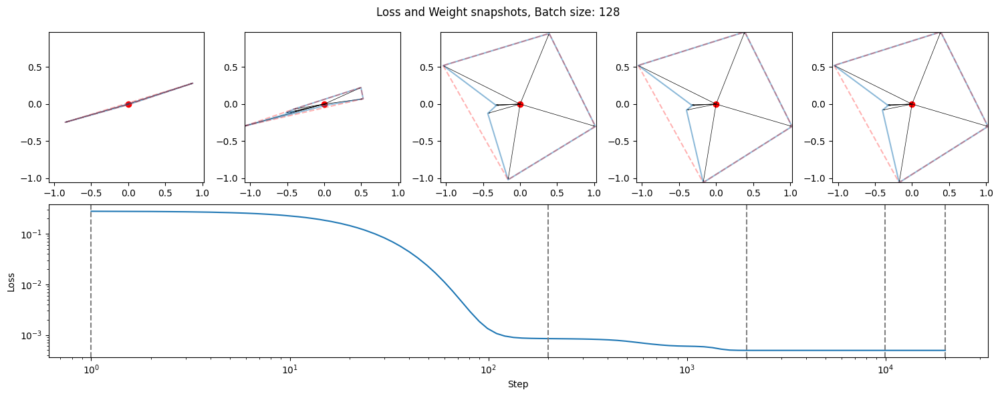

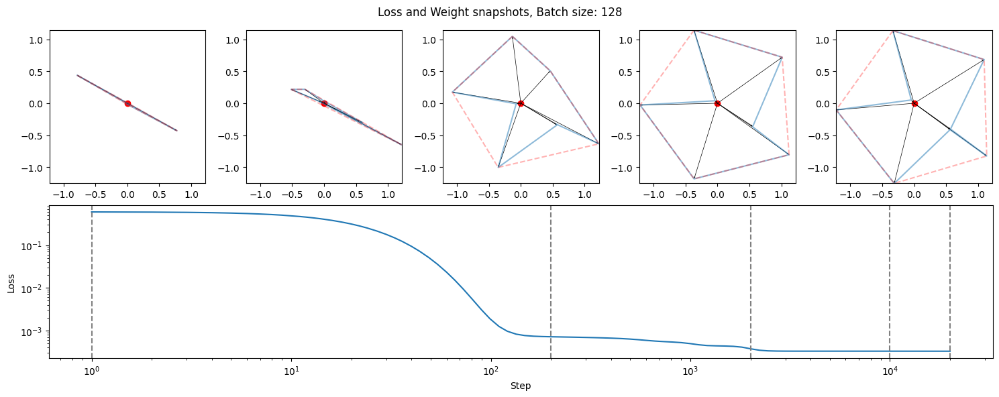

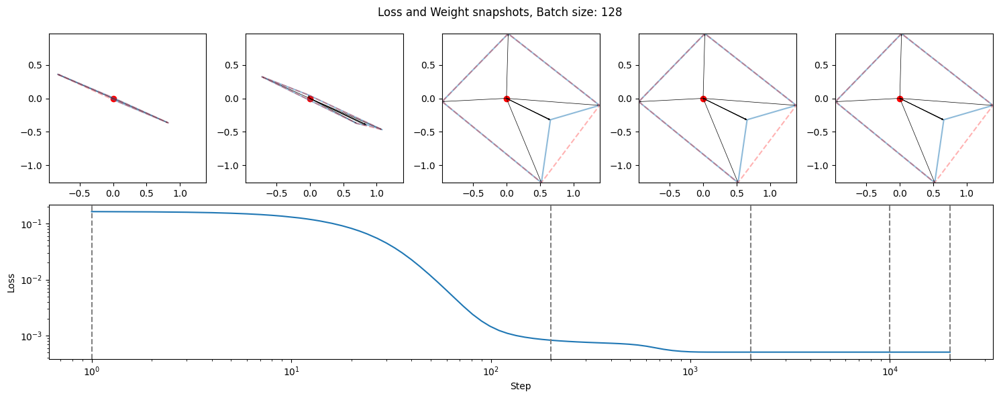

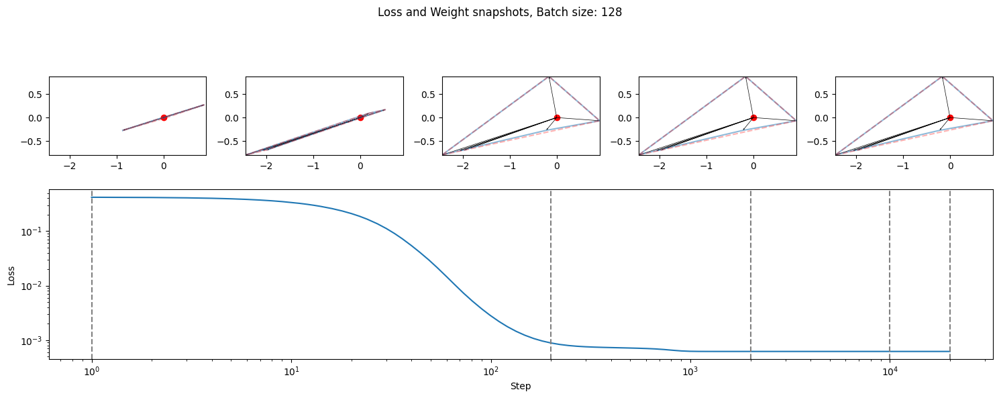

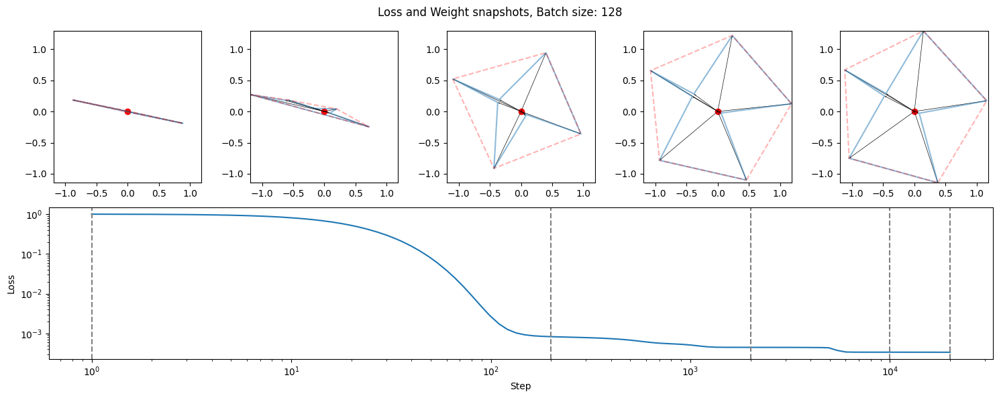

...

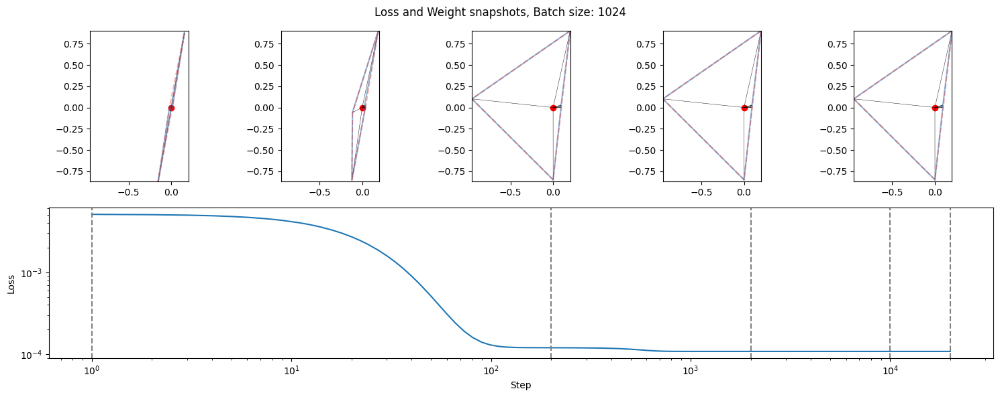

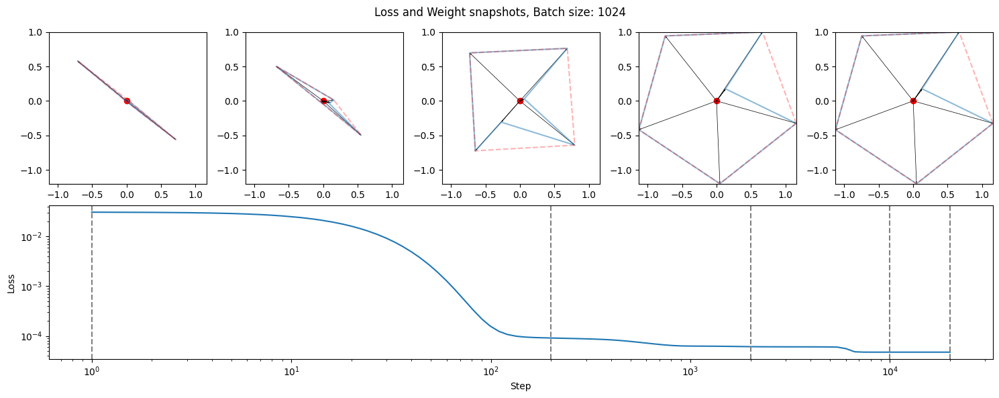

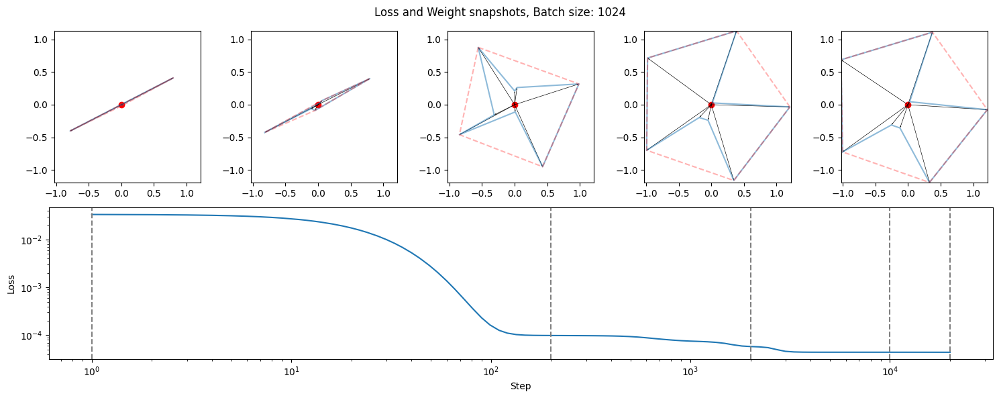

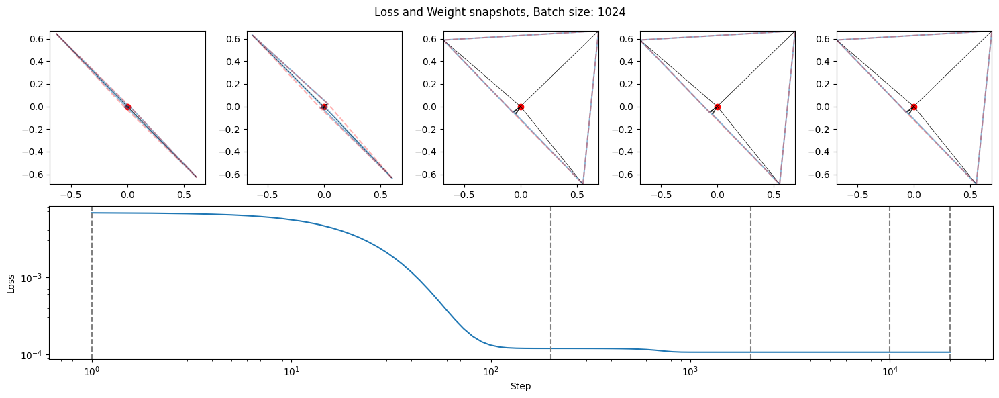

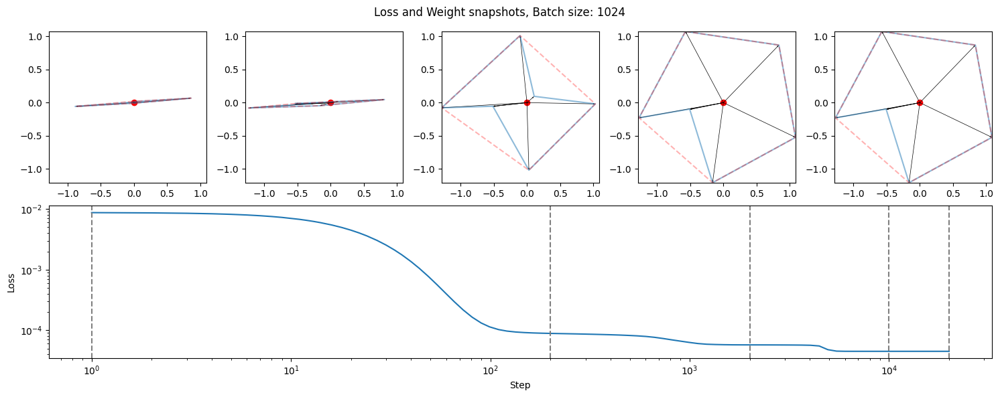

In [16]:
for batch_size in batch_sizes:
    for run in range(num_runs):
        all_weights = batch_weights[batch_size]
        all_logs = batch_logs[batch_size]
        weights_to_plot = [all_weights[run][i]['embedding.weight'] for i in PLOT_INDICES]
        losses = [all_logs[run].loc[all_logs[run]['step'] == s, 'loss'].values[0] for s in STEPS]
        plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, weights_to_plot, batch_size=batch_size)
        plt.show()
        

In [24]:
transform = lambda x: [weights_to_plot(w) for w in x]
{k:transform(b) for k,b in batch_weights.items()}

TypeError: 'list' object is not callable

TypeError: 'list' object is not callable

In [22]:
def plot_combined_losses(steps, losses, highlights, xscale="log", batch_size=None):
    fig, ax = plt.subplots(figsize=(15, 6))

    ax.plot(steps, losses)
    ax.set_xlabel("Step")
    ax.set_ylabel("Loss")
    ax.set_xscale(xscale)
    ax.set_yscale("log")

    for step in highlights:
        ax.axvline(step, color="gray", linestyle="--")

    batch_size_str = f"Batch size: {batch_size}" if batch_size is not None else ""
    plt.title("Combined Losses over Steps, " + batch_size_str)
    plt.tight_layout()

In [ ]:
def plot_combined_losses(steps, losses, highlights, xscale="log", batch_size=None):
    fig, ax = plt.subplots(figsize=(15, 6))

    ax.plot(steps, losses)
    ax.set_xlabel("Step")
    ax.set_ylabel("Loss")
    ax.set_xscale(xscale)
    ax.set_yscale("log")

    for step in highlights:
        ax.axvline(step, color="gray", linestyle="--")

    batch_size_str = f"Batch size: {batch_size}" if batch_size is not None else ""
    plt.title("Combined Losses over Steps, " + batch_size_str)
    plt.tight_layout()

In [31]:
def plot_all_losses(num_runs, all_logs, steps, plot_steps, xscale="log", batch_size=None):
    fig, ax = plt.subplots(figsize=(15, 6))

    for i in range(num_runs):
        losses = [all_logs[i].loc[all_logs[i]['step'] == s, 'loss'].values[0] for s in steps]
        ax.plot(steps, losses, label=f'Run {i+1}')

    ax.set_xlabel("Step")
    ax.set_ylabel("Loss")
    ax.set_xscale(xscale)
    ax.set_yscale("log")

    batch_size_str = f"Batch size: {batch_size}" if batch_size is not None else ""
    plt.title("Combined Losses over Steps for All Runs, " + batch_size_str)
    ax.legend()
    plt.tight_layout()

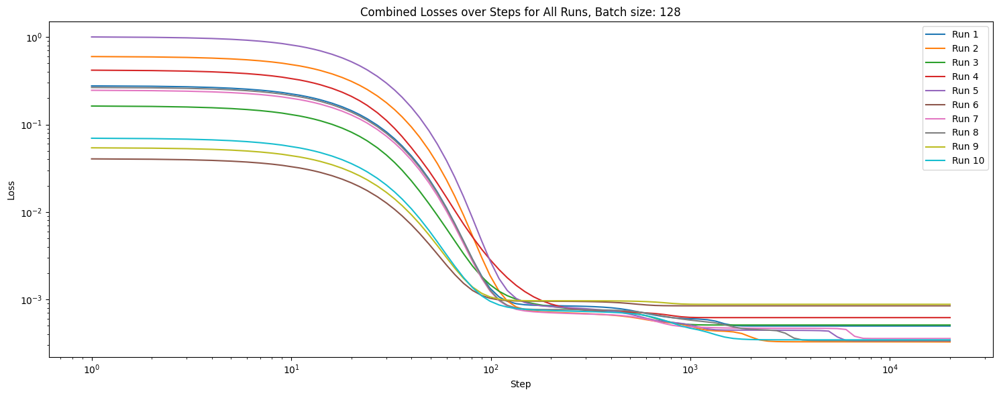

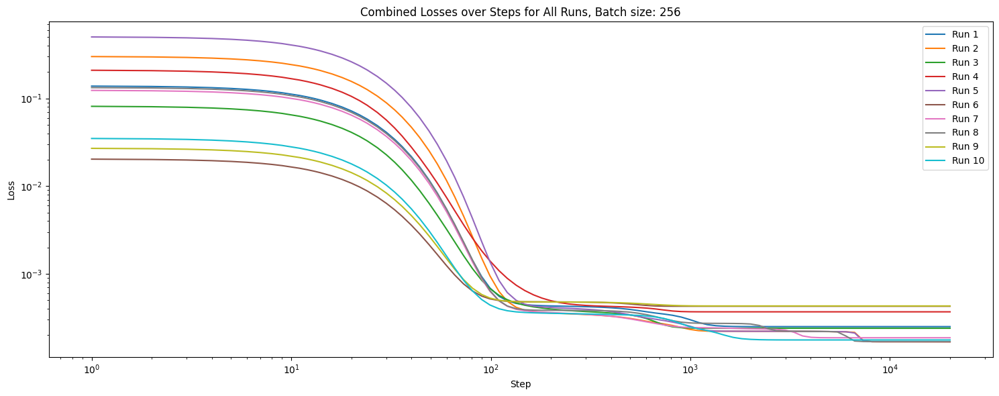

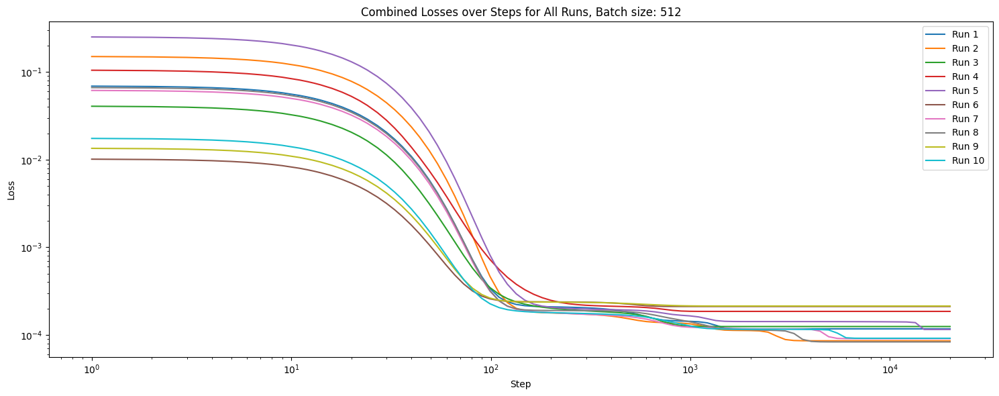

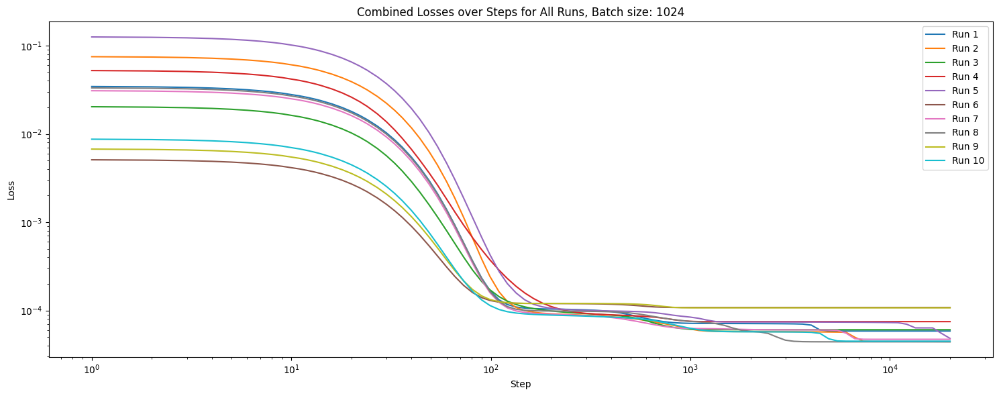

In [32]:
for batch_size in batch_sizes:
        # Example plotting for the first run of each batch size
    all_logs = batch_logs[batch_size]
    all_weights = batch_weights[batch_size]
    plot_all_losses(num_runs, all_logs, STEPS, PLOT_STEPS, batch_size=batch_size)

    #for i in range(num_runs):
    #    losses = [all_logs[i].loc[all_logs[i]['step'] == s, 'loss'].values[0] for s in STEPS]
    #    plot_combined_losses(STEPS, losses, PLOT_STEPS, batch_size=batch_size)       


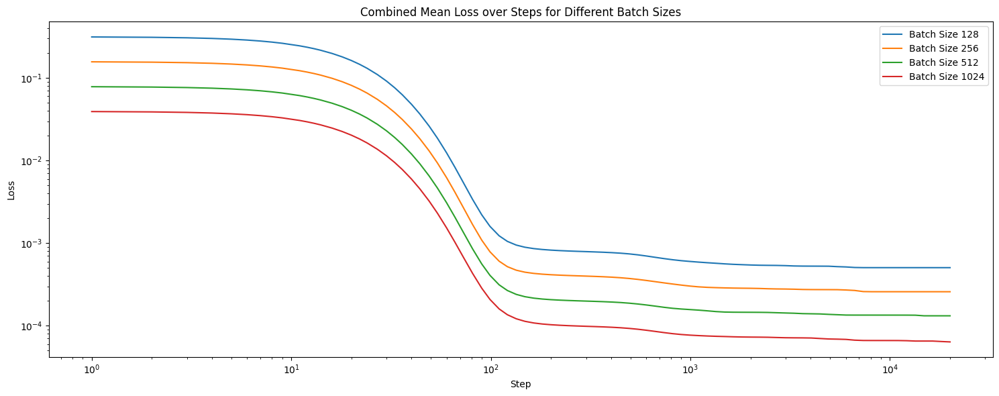

In [30]:
def plot_combined_mean_losses(num_runs, batch_logs, steps, plot_steps, batch_sizes):
    fig, ax = plt.subplots(figsize=(15, 6))

    for batch_size in batch_sizes:
        all_logs = batch_logs[batch_size]
        mean_losses = []

        for step in steps:
            step_losses = [all_logs[i].loc[all_logs[i]['step'] == step, 'loss'].values[0] for i in range(num_runs)]
            mean_losses.append(np.mean(step_losses))

        # Plotting the mean loss for each batch size
        ax.plot(steps, mean_losses, label=f'Batch Size {batch_size}')

    ax.set_xlabel("Step")
    ax.set_ylabel("Loss")
    ax.set_xscale("log")
    ax.set_yscale("log")

    plt.title("Combined Mean Loss over Steps for Different Batch Sizes")
    plt.legend()
    plt.tight_layout()

# Usage
plot_combined_mean_losses(num_runs, batch_logs, STEPS, PLOT_STEPS, batch_sizes)


In [ ]:
def weights_to_plot(weights: Dict[int, Dict[str, Any]], PLOT_INDICES: List[int]) -> List[Any]:
    return [weights[i]['embedding.weight'] for i in PLOT_INDICES]

def plot_losses_and_polygons_multi(steps: List[int], all_losses: List[List[float]], highlights: List[int], all_Ws: List[List[Any]], batch_sizes: List[int], xscale: str = "log") -> None:
    num_Ws_sets = len(all_Ws)
    num_columns = len(all_Ws[0]) if all_Ws else 1

    fig = plt.figure(figsize=(15, 6 + 4 * num_Ws_sets))
    gs = fig.add_gridspec(num_Ws_sets + 1, num_columns)

    # Plot for losses
    ax_losses = fig.add_subplot(gs[0, :])
    for losses, batch_size in zip(all_losses, batch_sizes):
        ax_losses.plot(steps, losses, label=f"Batch Size {batch_size}")
    ax_losses.set_xlabel("Step")
    ax_losses.set_ylabel("Loss")
    ax_losses.set_yscale("log")
    ax_losses.set_xscale(xscale)
    ax_losses.legend()

    for step in highlights:
        ax_losses.axvline(step, color="gray", linestyle="--")

    # Plot for each set of Ws
    for k, batch_size in zip(range(num_Ws_sets), batch_sizes):
        Ws = all_Ws[k]
        max_x, min_x = max([np.max(W[0]) for W in Ws]), min([np.min(W[0]) for W in Ws])
        max_y, min_y = max([np.max(W[1]) for W in Ws]), min([np.min(W[1]) for W in Ws])

        for i in range(num_columns):
            ax = fig.add_subplot(gs[k + 1, i], adjustable='box')
            ax.set_title(f"Batch Size {batch_size}, Step {highlights[i]}")
            ax.set_aspect('equal')
            ax.set_xlim(min_x, max_x)
            ax.set_ylim(min_y, max_y)
            plot_polygons([Ws[i]], [ax])  # Assuming plot_polygons can handle a list of one W and one ax

    plt.suptitle("Loss and Weight snapshots")
    plt.tight_layout()
    plt.show()

batch_logs = {}
batch_weights = {}
batch_sizes = []

for version in ["v1.3.0"]:
    with open(f"results/batch_logs_{version}.pkl", "rb") as f:
        batch_logs.update(pickle.load(f))
    with open(f"results/batch_weights_{version}.pkl", "rb") as f:
        batch_weights.update(pickle.load(f))
    with open(f"results/batch_sizes_{version}.pkl", "rb") as f:
        batch_sizes.extend(pickle.load(f))
        batch_sizes = sorted(list(set(batch_sizes)))
plot_losses_and_polygons_multi(STEPS, [batch_logs[batch_size]['loss'] for batch_size in batch_sizes], PLOT_STEPS, [weights_to_plot(batch_weights[batch_size], PLOT_INDICES) for batch_size in batch_sizes], batch_sizes)


In [37]:
embedding_weights = {k:[[w[i]['embedding.weight'] for i in range(len(w)) if i!=0] for w in b] for k,b in batch_weights.items()}

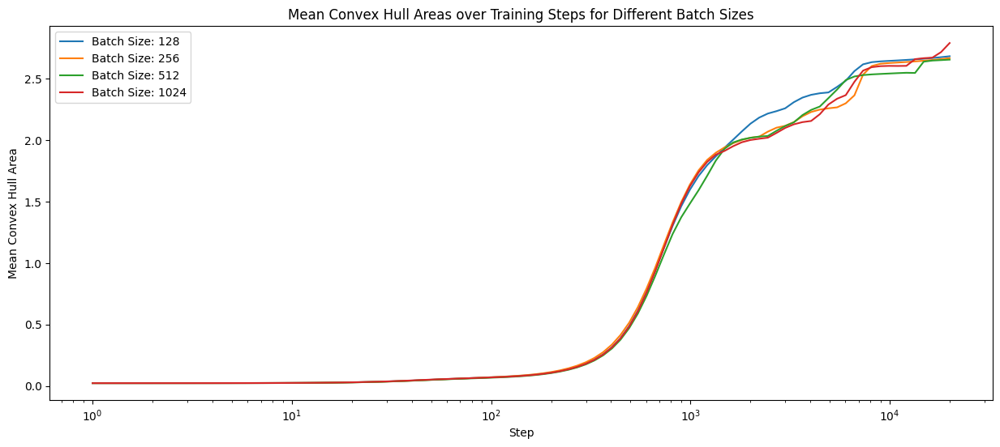

In [38]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
import torch

def calculate_convex_hull_area(W):
    """
    Calculate the area of the convex hull of the points represented by the columns of W.
    
    Parameters:
    W (torch.Tensor): A 2xN matrix where each column represents a point in 2D space.
    
    Returns:
    float: The area of the convex hull.
    """
    if W.shape[0] != 2:
        raise ValueError("The weight matrix W must have 2 rows.")
    
    # Convert the tensor to a numpy array if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    hull = ConvexHull(W.T)
    return hull.volume  # In 2D, hull.volume gives the area

def plot_hull_areas_over_time(batch_weights, steps):
    plt.figure(figsize=(15, 6))
    
    # Iterate over each batch size
    for batch_size, runs_weights in batch_weights.items():
        # Calculate the mean area of the convex hull for each timestep across all runs
        mean_areas = []
        for step_weights in zip(*runs_weights):  # This transposes the list of lists
            step_areas = [calculate_convex_hull_area(W) for W in step_weights]
            mean_areas.append(np.mean(step_areas))
        
        # Plot the mean area over time for each batch size
        plt.plot(steps, mean_areas, label=f'Batch Size: {batch_size}')
    
    plt.xlabel('Step')
    plt.ylabel('Mean Convex Hull Area')
    plt.xscale('log')
    #plt.yscale('log')
    plt.title('Mean Convex Hull Areas over Training Steps for Different Batch Sizes')
    plt.legend()
    plt.show()

# Assuming 'batch_weights' is your dictionary of weights, 'STEPS' is your list of timesteps

plot_hull_areas_over_time(embedding_weights, STEPS)


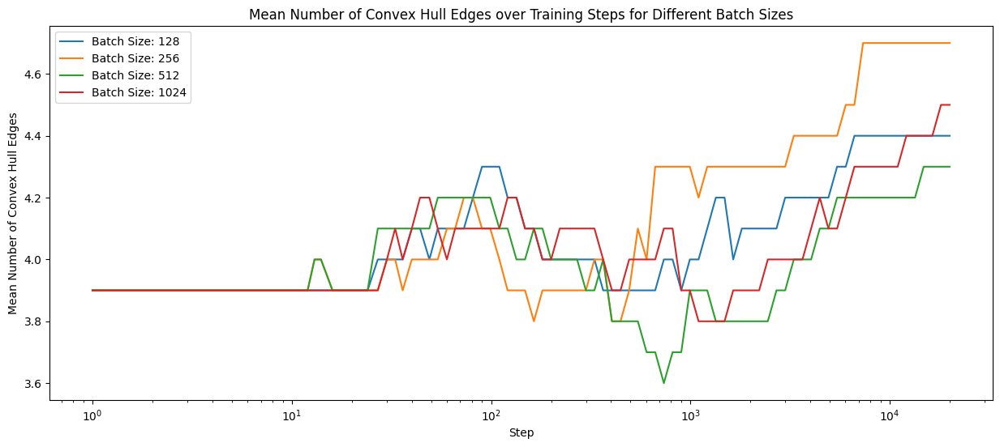

In [41]:
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
import torch

def calculate_convex_hull_edges(W):
    """
    Calculate the number of edges of the convex hull of the points represented by the columns of W.
    
    Parameters:
    W (torch.Tensor): A 2xN matrix where each column represents a point in 2D space.
    
    Returns:
    int: The number of edges of the convex hull.
    """
    if W.shape[0] != 2:
        raise ValueError("The weight matrix W must have 2 rows.")
    
    # Convert the tensor to a numpy array if it isn't already
    if isinstance(W, torch.Tensor):
        W = W.cpu().detach().numpy()
    
    hull = ConvexHull(W.T)
    return len(hull.vertices)  # The number of vertices is the same as the number of edges

def plot_hull_edges_over_time(batch_weights, steps):
    plt.figure(figsize=(15, 6))
    
    # Iterate over each batch size
    for batch_size, runs_weights in batch_weights.items():
        # Calculate the mean number of edges of the convex hull for each timestep across all runs
        mean_edges = []
        for step_weights in zip(*runs_weights):  # This transposes the list of lists
            step_edges = [calculate_convex_hull_edges(W) for W in step_weights]
            mean_edges.append(np.mean(step_edges))
        
        # Plot the mean number of edges over time for each batch size
        plt.plot(steps, mean_edges, label=f'Batch Size: {batch_size}')
    
    plt.xlabel('Step')
    plt.ylabel('Mean Number of Convex Hull Edges')
    plt.xscale('log')
    plt.title('Mean Number of Convex Hull Edges over Training Steps for Different Batch Sizes')
    plt.legend()
    plt.show()

# Assuming 'batch_weights' is your dictionary of weights, 'STEPS' is your list of timesteps
plot_hull_edges_over_time(embedding_weights, STEPS)


This measure above is not really good, because it already starts out with almost 4 for small timesteps when the thing is very degenerate

It seems in the above plot like the trend between time of phase transition and batch size reverses. Next seeing what the trend is for batch sizes between 100 and 1000.

## Analysis

### Local learning coefficient estimation

See the other notebooks for more details on learning coefficient estimation. 

In [78]:
# Sweep SGLD hyperparameters

NUM_SAMPLES_TEST = 200
NUM_DRAWS_SGLD = 100
NUM_CHAINS_SGLD = 5

dataset = SyntheticBinaryValued(NUM_SAMPLES_TEST, NUM_FEATURES, 1)
dataset_double = TensorDataset(dataset.data, dataset.data)
model = ToyAutoencoder(NUM_FEATURES, NUM_HIDDEN_UNITS, final_bias=True)

def sweep_lambdahat_estimation_hyperparams(
        model, 
        dataset, 
        device=DEVICE,
        sgld_kwargs=None,
        num_draws=NUM_DRAWS_SGLD,
        num_chains=NUM_CHAINS_SGLD,
        weights=weights,
):
    observations = []
    hyperparam_combos = list(itertools.product([1, 10, 30, 100, 300], [1e-5, 1e-4, 1e-3, 1e-2]))

    sgld_kwargs = sgld_kwargs or {}
    sgld_kwargs.setdefault("num_samples", len(dataset))
    sgld_kwargs.setdefault("elasticity", 1.)

    for batch_size, lr in tqdm(hyperparam_combos, desc="Sweeping hyperparameters",):
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
        model.load_state_dict({k: torch.Tensor(v) for k, v in weights[-1].items()})

        observation = estimate_learning_coeff_with_summary(
                model,
                loader,
                F.mse_loss,
                device=device,
                sampling_method=SGLD,
                optimizer_kwargs={
                    "lr": lr,
                    **sgld_kwargs
                },
                verbose=False,
                num_draws=num_draws,
                num_chains=num_chains,
                online=True
            )

        for t_sgld in range(num_draws):
            observations.append({
                    "llc": observation["llc/means"][t_sgld].item(),
                    "llc/std": observation["llc/stds"][t_sgld].item(),
                    "batch_size": batch_size,
                    "lr": lr,
                    "t_sgld": t_sgld,
                    "llc_type": "mean",
                    "loss": observation["loss/trace"][:, t_sgld].mean().item()
                })
            
            for llc_type in range(num_chains):
                observations.append({
                    "llc": observation["llc/trace"][llc_type, t_sgld].item(),
                    "batch_size": batch_size,
                    "lr": lr,
                    "t_sgld": t_sgld,
                    "llc_type": str(llc_type),
                    "loss": observation["loss/trace"][llc_type, t_sgld].item(),
                })

    return pd.DataFrame(observations)

lambdahat_sweep_df = sweep_lambdahat_estimation_hyperparams(model, dataset_double)
lambdahat_sweep_df

Sweeping hyperparameters:  20%|██        | 4/20 [00:01<00:04,  3.28it/s]/home/tassilo/repos/devinterp/.venv/lib/python3.10/site-packages/devinterp/slt/sampler.py:46: UserWarning: You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)
  warnings.warn('You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)')
Sweeping hyperparameters: 100%|██████████| 20/20 [00:07<00:00,  2.68it/s]


,llc,llc/std,batch_size,lr,t_sgld,llc_type,loss
0,0.000000,0.0,1,0.00001,0,mean,0.055041
1,0.000000,NaN,1,0.00001,0,0,0.010752
2,0.000000,NaN,1,0.00001,0,1,0.010752
3,0.000000,NaN,1,0.00001,0,2,0.003699
4,0.000000,NaN,1,0.00001,0,3,0.125000
...,...,...,...,...,...,...,...
11995,3.496876,NaN,300,0.01000,99,0,0.119164
11996,4.657843,NaN,300,0.01000,99,1,0.143457
11997,4.299704,NaN,300,0.01000,99,2,0.180611
11998,3.970765,NaN,300,0.01000,99,3,0.138259


Sweeping hyperparameters:  20%|██        | 4/20 [00:01<00:05,  3.12it/s]/home/tassilo/repos/devinterp/.venv/lib/python3.10/site-packages/devinterp/slt/sampler.py:46: UserWarning: You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)
  warnings.warn('You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)')
Sweeping hyperparameters: 100%|██████████| 20/20 [00:08<00:00,  2.42it/s]


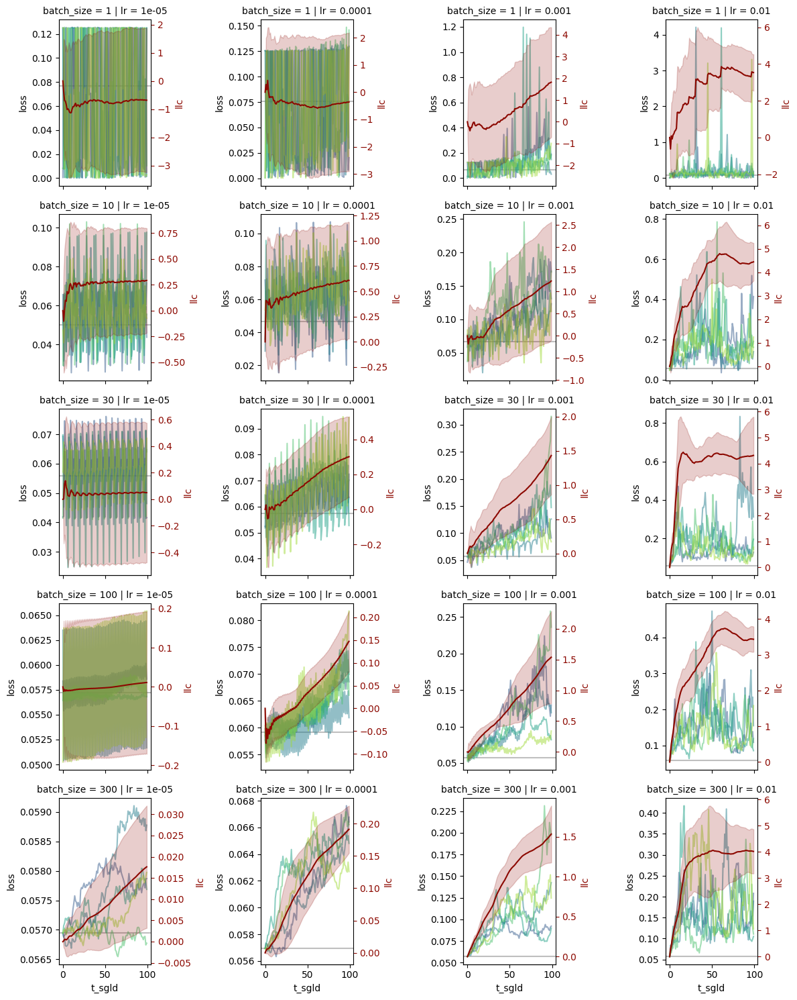

Sweeping hyperparameters:  20%|██        | 4/20 [00:01<00:05,  3.11it/s]/home/tassilo/repos/devinterp/.venv/lib/python3.10/site-packages/devinterp/slt/sampler.py:46: UserWarning: You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)
  warnings.warn('You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)')
Sweeping hyperparameters: 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]


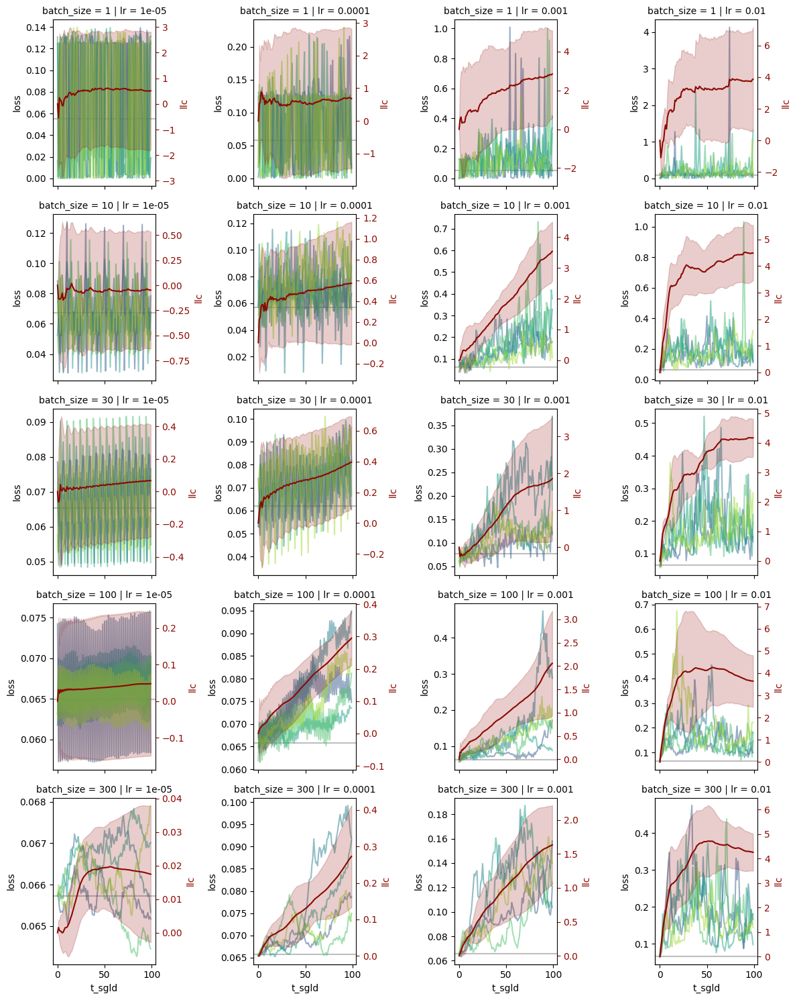

Sweeping hyperparameters:  20%|██        | 4/20 [00:01<00:05,  3.17it/s]/home/tassilo/repos/devinterp/.venv/lib/python3.10/site-packages/devinterp/slt/sampler.py:46: UserWarning: You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)
  warnings.warn('You are taking more sample batches than there are dataloader batches available, this removes some randomness from sampling but is probably fine. (All sample batches beyond the number dataloader batches are cycled from the start, f.e. 9 samples from [A, B, C] would be [B, A, C, B, A, C, B, A, C].)')
Sweeping hyperparameters: 100%|██████████| 20/20 [00:11<00:00,  1.67it/s]


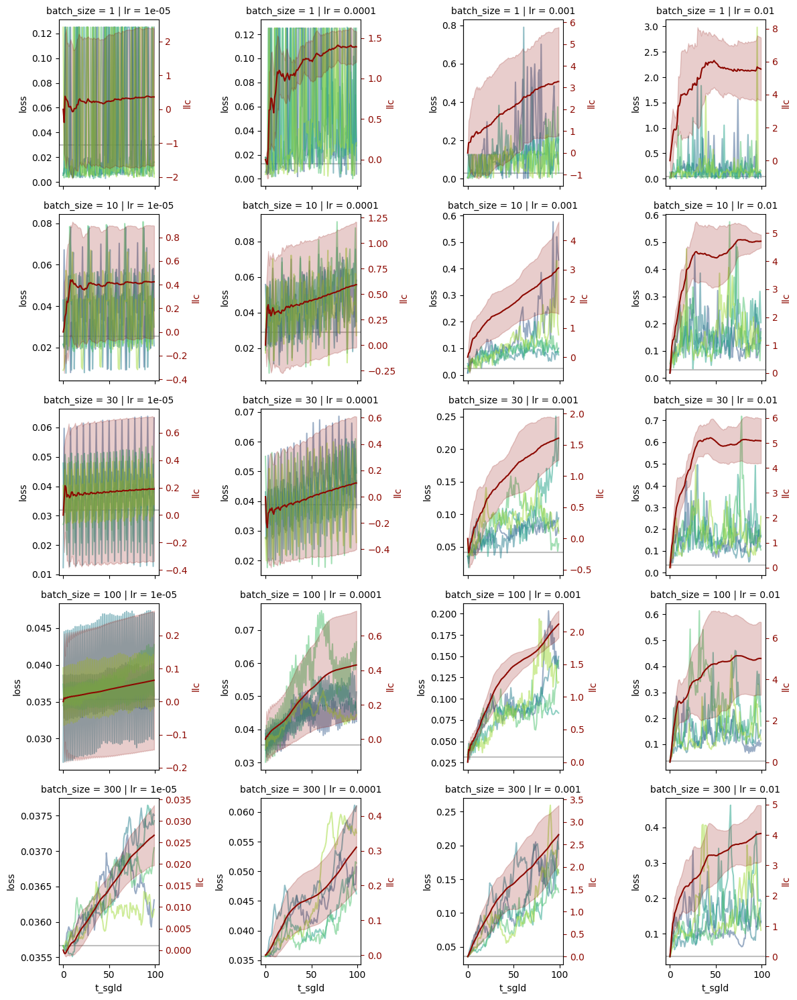

In [ ]:
# Plot SGLD hyperparameter grid sweep

import seaborn as sns
def plot_losses(data, **kwargs):
    if kwargs["label"] == "mean":
        plt.axhline(data.loc[data.t_sgld == 0, "loss"].values[0], color="grey", alpha=0.5)
        return

    _data = data.loc[data.llc_type != "mean"]
    sns.lineplot(_data, x="t_sgld", y="loss", **kwargs, alpha=0.5)

def plot_llcs(data, **kwargs):
    if kwargs["label"] != "mean":
        return
    _data = data.loc[data.llc_type == "mean"]
    ax = plt.twinx()
    kwargs.pop("color")
    color = sns.color_palette("dark")[3]
    ax.plot(_data['t_sgld'], _data['llc'], color=color, **kwargs)
    ax.fill_between(_data['t_sgld'], _data['llc'] - _data['llc/std'], _data['llc'] + _data['llc/std'], color=color, alpha=0.2)
    ax.set_ylabel("llc", color=color)
    ax.tick_params(axis='y', colors=color)
def plot_lambdahat_estimation_hyperparams(observations_df):


    g = sns.FacetGrid(observations_df, col="lr", row="batch_size", hue="llc_type", palette="viridis", sharey=False)
    g.map_dataframe(plot_losses)
    g.map_dataframe(plot_llcs)

    g.fig.set_facecolor('white')
    g.fig.tight_layout()

    plt.show()


#plot_lambdahat_estimation_hyperparams(lambdahat_sweep_df)
batch_lambda_hat_sweep_dfs = {}
for batch_size in batch_sizes:
    lambdahat_sweep_df = sweep_lambdahat_estimation_hyperparams(model, dataset_double, weights=batch_weights[batch_size])
    batch_lambda_hat_sweep_dfs[batch_size] = lambdahat_sweep_df
    plot_lambdahat_estimation_hyperparams(lambdahat_sweep_df)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def calculate_mean_lambda_hat_for_batch_size(model, dataset, batch_size, num_runs=10):
    # Initialize a DataFrame to store all observations across runs
    all_runs_observations = pd.DataFrame()

    # Loop over the number of runs
    for run_num in range(num_runs):
        # Call your function to perform the lambda hat estimation for the current run
        # Assuming it returns a DataFrame with the results
        observations_df = sweep_lambdahat_estimation_hyperparams(model, dataset, weights=batch_weights[batch_size][run_num], batch_size=batch_size, lr=0.001)
        
        # Add a column to differentiate runs
        observations_df['run_num'] = run_num
        
        # Append the results to the all runs DataFrame
        all_runs_observations = pd.concat([all_runs_observations, observations_df])

    # Group by t_sgld and calculate the mean llc
    mean_observations = all_runs_observations.groupby('t_sgld').agg({'llc': 'mean', 'llc/std': 'mean'}).reset_index()
    
    # Return the DataFrame with the mean llc values
    return mean_observations

def plot_lambdahat_estimation_for_all_batch_sizes(model, dataset, batch_sizes):
    # Prepare the seaborn grid for plotting
    g = sns.FacetGrid(col="batch_size", sharey=False)
    
    # Loop through each batch size and plot the mean complexity
    for batch_size in batch_sizes:
        mean_observations = calculate_mean_lambda_hat_for_batch_size(model, dataset, batch_size)
        g.map_dataframe(plot_losses, data=mean_observations, label="mean")
        g.map_dataframe(plot_llcs, data=mean_observations, label="mean")
    
    g.fig.set_facecolor('white')
    g.fig.tight_layout()
    plt.show()

# Assuming model and dataset_double are predefined and you have a list of batch sizes
plot_lambdahat_estimation_for_all_batch_sizes(model, dataset_double, batch_sizes)


In [103]:
def get_mean_llc(df,batch_size,lr=0.01, estimate_batch_size=100):
    df = batch_lambda_hat_sweep_dfs[batch_size]
    df = df[df.lr == lr][df.batch_size == estimate_batch_size]
    return df[df.llc_type == "mean"].llc

/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]


<Axes: >

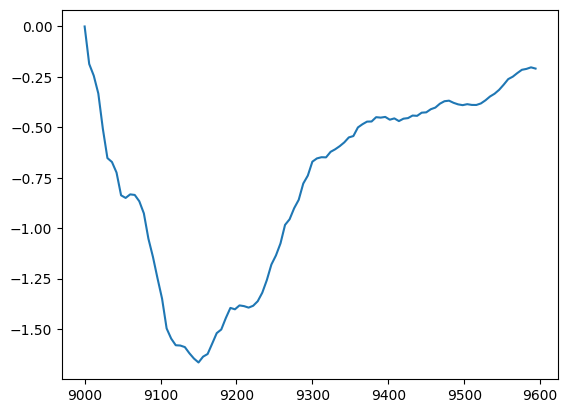

In [105]:
(get_mean_llc(batch_lambda_hat_sweep_dfs,10) - get_mean_llc(batch_lambda_hat_sweep_dfs,100)).plot()

/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]


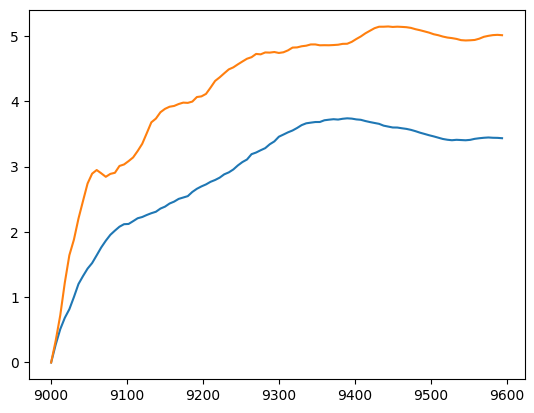

In [113]:
get_mean_llc(batch_lambda_hat_sweep_dfs,10).plot()
get_mean_llc(batch_lambda_hat_sweep_dfs,1000).plot()

plt.show()

In [119]:
batch_weights[10][0]['embedding.weight'].shape

(2, 8)

ValueError: W must have either 2 or 3 rows

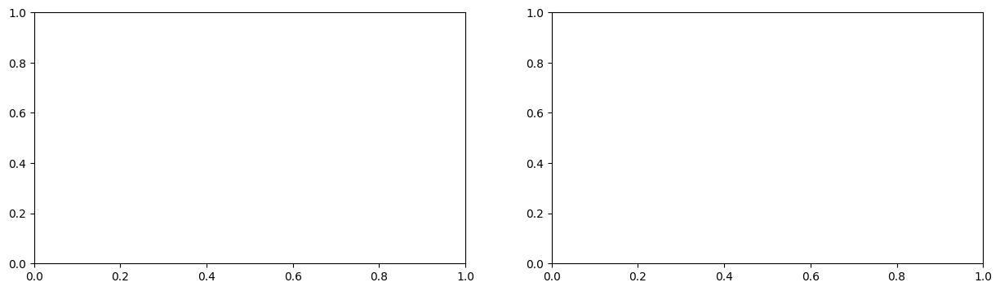

In [117]:
plot_polygons(batch_weights[10][0]['embedding.weight'])

In [ ]:
def plot_polygons(Ws, axes=None):
    if axes is None:
        fig, axes = plt.subplots(1, len(Ws), figsize=(15, 4))

    for ax, W in zip(axes, Ws):
        plot_polygon(W, ax=ax)


/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[df.lr == lr][df.batch_size == estimate_batch_size]
/tmp/ipykernel_452510/4147282157.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df 

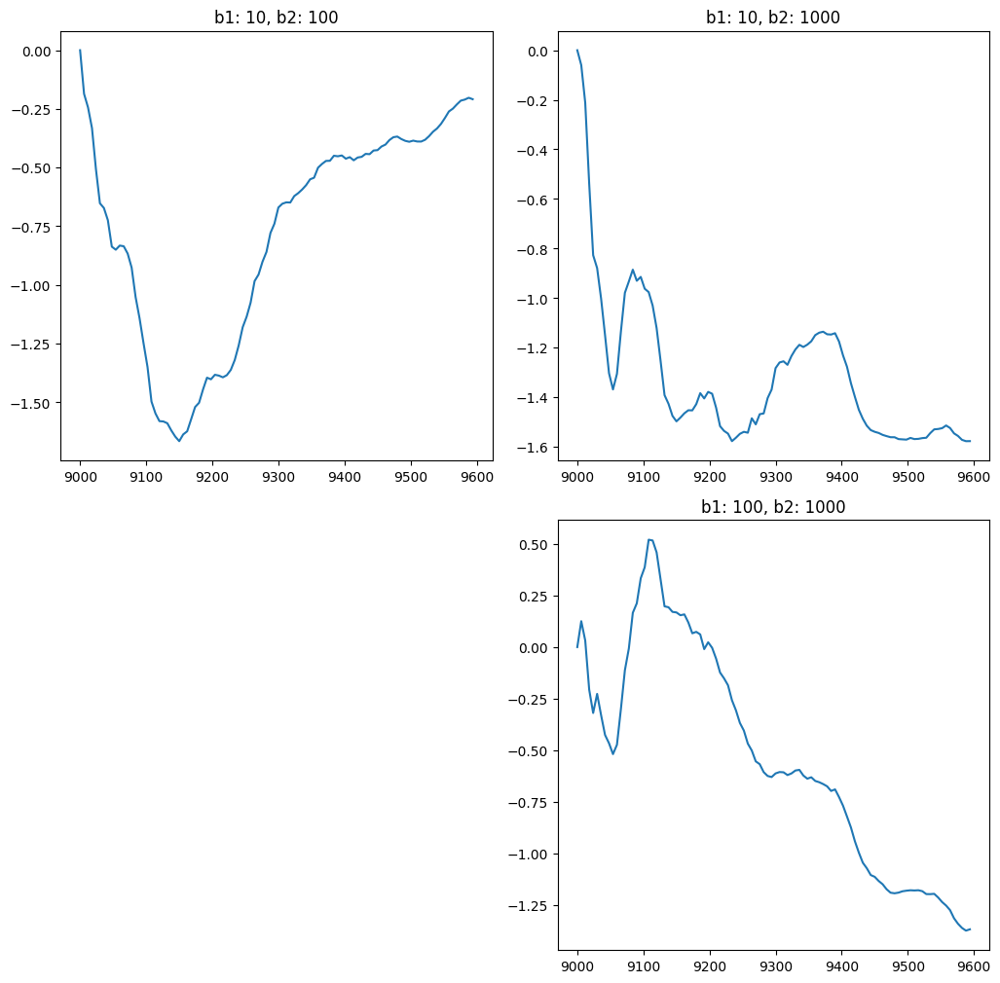

In [108]:
#batch_sizes = [/* your batch sizes here */]
n = len(batch_sizes)
plt.figure(figsize=(n*5, n*5))

for i, b1 in enumerate(batch_sizes):
    for j, b2 in enumerate(batch_sizes):
        if b1 < b2:
            plt.subplot(n, n, i * n + j + 1)
            diff = get_mean_llc(batch_lambda_hat_sweep_dfs, b1) - get_mean_llc(batch_lambda_hat_sweep_dfs, b2)
            diff.plot()  # assuming this returns a pandas Series or similar
            plt.title(f"b1: {b1}, b2: {b2}")

plt.tight_layout()
plt.show()

In [95]:
def plot_llcs(data, **kwargs):
    if kwargs["label"] != "mean":
        return
    _data = data.loc[data.llc_type == "mean"]
    ax = plt.twinx()
    kwargs.pop("color")
    color = sns.color_palette("dark")[3]
    ax.plot(_data['t_sgld'], _data['llc'], color=color, **kwargs)
    ax.fill_between(_data['t_sgld'], _data['llc'] - _data['llc/std'], _data['llc'] + _data['llc/std'], color=color, alpha=0.2)
    ax.set_ylabel("llc", color=color)
    ax.tick_params(axis='y', colors=color)

plot_llcs(df)

KeyError: 'label'

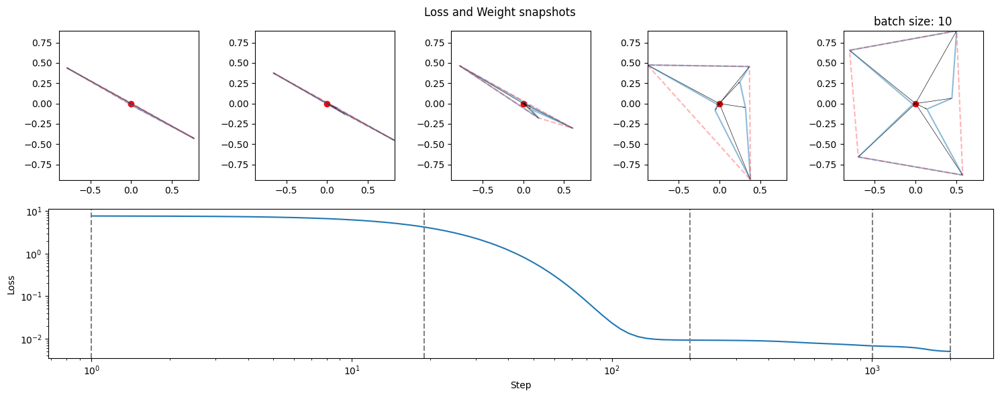

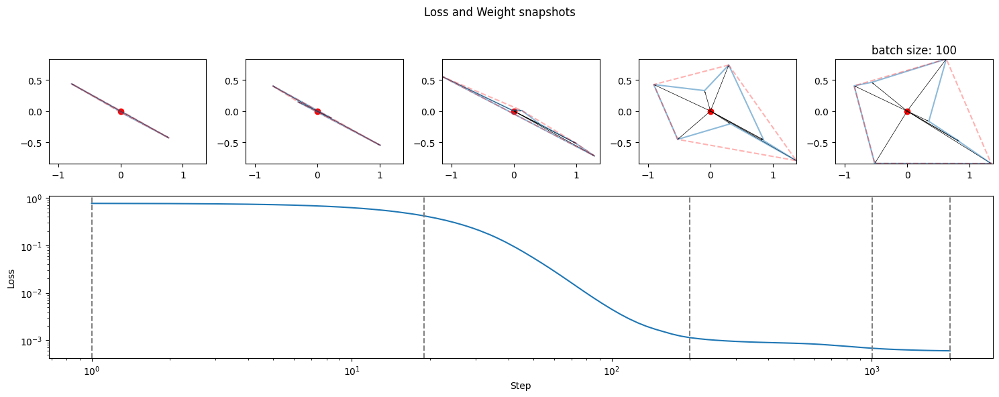

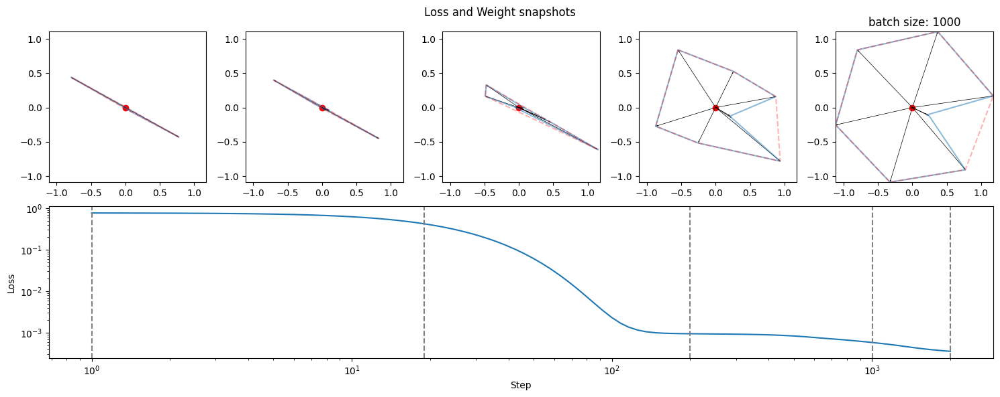

In [150]:
#PLOT_STEPS = [min(STEPS, key=lambda s: abs(s-i)) for i in [0, 200, 2000, 10000, NUM_EPOCHS - 1]]


for batch_size in batch_sizes:
    logs, weights = batch_logs[batch_size], batch_weights[batch_size]
    weights_to_plot = [weights[i]['embedding.weight'] for i in PLOT_INDICES]
    losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
    plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, weights_to_plot)
    plt.title(f"batch size: {batch_size}")
    #plt.show()
#weights_to_plot = [weights[i]['embedding.weight'] for i in PLOT_INDICES]
#losses = [logs.loc[logs['step'] == s, 'loss'].values[0] for s in STEPS]
#plot_losses_and_polygons(STEPS, losses, PLOT_STEPS, weights_to_plot)


In [141]:
len(batch_weights[10])

79

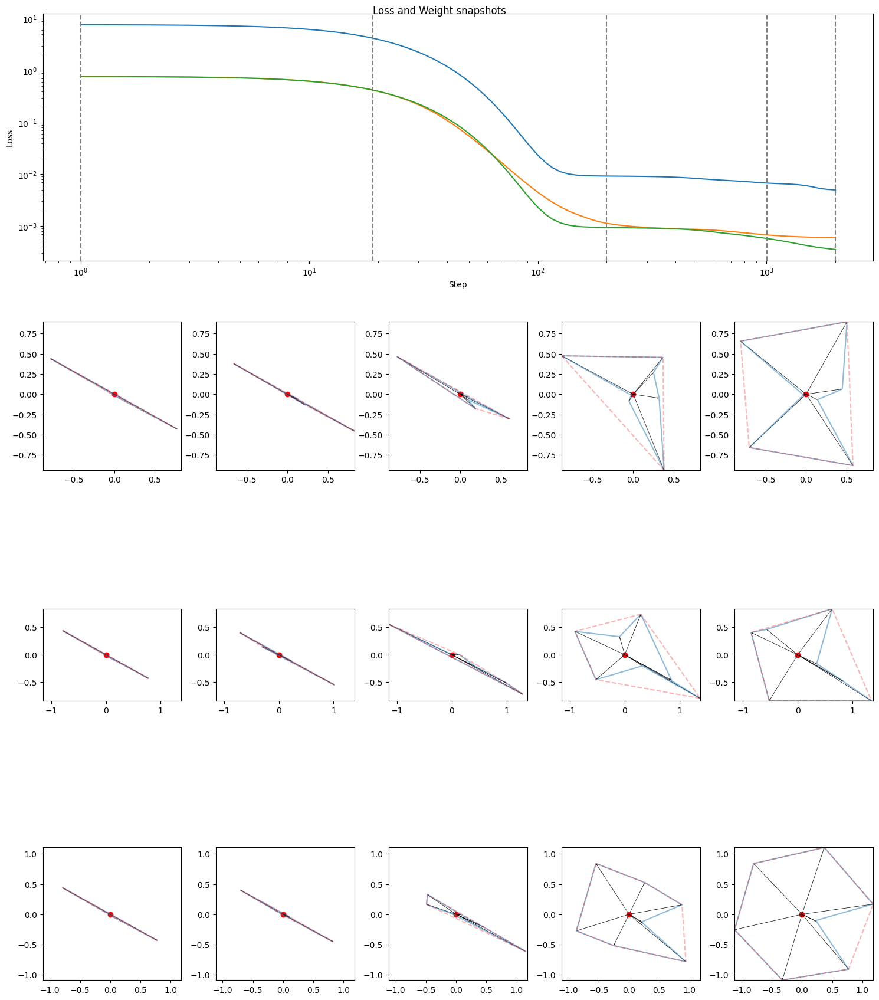

### Covariance Analysis

The idea behind covariance analysis is to look at the covariance between weights across a bunch of different trajectories and how this changes over time. 

Based on literature from developmental biology ([Freedman et al. 2023](https://journals.biologists.com/dev/article/150/11/dev201280/312613/A-dynamical-systems-treatment-of-transcriptomic)), we expect transitions to be associated with discontinuous increases in the maximal eigenvalues of the covariance matrix. Moreover, by looking at the associated eigenvectors, we can get a sense of how the weights are involved in these transitions, that is, "where the circuits are forming."

**A note on tractability:** These models are small enough that we can handle the full covariance matrix, but in general we'll have to consider simplifications like looking at covariances within a specific layer. In the same vein, we will generally consider only a subset of the covariance eigenspectrum, e.g., the largest-K eigenvalues, which can be cheaply estimated using power iteration.

**Versus SGLD estimation:** In principle, we could perform covariance analysis over the weights sampled by SGLD. Unlike SGLD-based sampling for lambdahat estimation, we'll want to include a larger thinning factor because weights at more of risk for autocorrelation. For reasons we'll flesh out in the future, we think it's probably best to do covariance across different trajectories *at the same point in time*. This means drawing only one sample per chain. We'll want to sample more and shorter chains. 

In [10]:

from typing import List
from devinterp.slt.callback import SamplerCallback
from devinterp.slt.cov import WeightAccessor
from scipy.sparse.linalg import eigsh


class CovarianceAccumulator(SamplerCallback):
    """
    A callback to iteratively compute and store the covariance matrix of model weights.
    For use with `estimate`. 

    Attributes:
        num_weights (int): Total number of weights.
        first_moment (torch.Tensor): First moment of weights.
        second_moment (torch.Tensor): Second moment of weights.
        num_draws (int): Number of draws made to accumulate moments.
        accessors (List[WeightAccessor]): Functions to access model weights.
        num_evals (int): Number of eigenvalues to compute.
    """
    def __init__(self, num_draws_per_chain: int, num_chains: int, num_weights: int, accessors: List[WeightAccessor], device = "cpu", num_evals=3):
        """
        Initialize the accumulator.
        """        
        self.num_weights = num_weights
        self.first_moment = torch.zeros(num_weights, device=device)
        self.second_moment = torch.zeros(num_weights, num_weights, device=device)
        self.num_draws = num_draws_per_chain * num_chains
        self.accessors = accessors
        self.num_evals = num_evals
        self.is_finished = False

    def accumulate(self, model: nn.Module):
        """Accumulate moments from model weights."""
        assert not self.is_finished, "Cannot accumulate after finalizing."

        weights = torch.cat([accessor(model).view((-1,)) for accessor in self.accessors])
        self.first_moment += weights / self.num_draws
        self.second_moment += torch.outer(weights, weights) / (self.num_draws - 1)
        # print(self.first_moment.mean(), self.second_moment.mean())

    def finalize(self):
        """Finalize the moments by dividing by the number of draws."""
        self.is_finished = True

    def reset(self):
        """Reset the accumulator."""
        self.first_moment.zero_()
        self.second_moment.zero_()
        self.is_finished = False

    def to_matrix(self):
        """Convert the moments to a covariance matrix."""
        return self.second_moment - (self.num_draws / (self.num_draws - 1)) * torch.outer(self.first_moment, self.first_moment)

    def to_eigen(self, include_matrix=False):
        """Convert the covariance matrix to pairs of eigenvalues and vectors."""
        cov = self.to_matrix().detach().cpu().numpy()
        evals, evecs = eigsh(cov, k=self.num_evals, which='LM')

        results = {
            "evals": evals,
            "evecs": evecs
        }

        if include_matrix:
            results["matrix"] = cov

        return results

    def sample(self):
        return self.to_eigen(include_matrix=True)
        
    def __call__(self, model):
        self.accumulate(model)

#### Calibrating Covariance Estimation

As mentioned, we're currently interested in using covariance analysis over SGD trajectories rather than local posterior samples. By default, we recommend setting hyperparameters like sampling noise and localization strength to match the original SGD hyperparameters used during training (i.e., set them equal to zero). 

First, let's see what difference it makes whether we use SGD or SGLD. We'll sweep over different batch sizes and interpolate between zero injected Gaussian noise (SGD) and standard SGLD (noise = 1.0). We'll use a localization strength of 0.0 for now.

In [11]:
# Sweep covariance estimation hyperparameters

NUM_DRAWS_COV = 1
NUM_BURNIN_COV = 10
NUM_CHAINS_COV = 50
NUM_EIGVALS_COV = 3

def sweep_covariance_estimation_hyperparams(
        model, 
        dataset, 
        steps, 
        checkpoints, 
        grid: dict,
        device=DEVICE, 
        sgld_kwargs=None,
        sampling_kwargs=None,
):
    observations = []
    accessors = {
        "weight": lambda model: model.embedding.weight,
        "bias": lambda model: model.unembedding.bias,
    }
    num_weights = sum([v(model).numel() for v in accessors.values()])
    hyperparam_combos = list(itertools.product(*grid.values()))

    sgld_kwargs = sgld_kwargs or {}
    sgld_kwargs.setdefault("noise_level", 1.)
    sgld_kwargs.setdefault("num_samples", len(dataset))
    sgld_kwargs.setdefault("elasticity", 0.)
    sgld_kwargs.setdefault("lr", 0.01)

    loader_kwargs = {"batch_size": 100}

    sampling_kwargs = sampling_kwargs or {}
    sampling_kwargs.setdefault("num_draws", NUM_DRAWS_COV)
    sampling_kwargs.setdefault("num_chains", NUM_CHAINS_COV)
    sampling_kwargs.setdefault("num_burnin_steps", NUM_BURNIN_COV)
    sampling_kwargs.setdefault("num_evals", NUM_EIGVALS_COV)

    for i, hyperparam_values in tqdm(enumerate(hyperparam_combos), total=len(hyperparam_combos), desc="Sweeping hyperparameters"):
        torch.manual_seed(i)
        hyperparams = dict(zip(grid.keys(), hyperparam_values))

        _sgld_kwargs = sgld_kwargs.copy()    
        _loader_kwargs = loader_kwargs.copy()
        _sampling_kwargs = sampling_kwargs.copy()

        for key in hyperparams:
            if key in _sgld_kwargs:
                _sgld_kwargs[key] = hyperparams[key]
            elif key in _loader_kwargs:
                _loader_kwargs[key] = hyperparams[key]
            elif key in _sampling_kwargs:
                _sampling_kwargs[key] = hyperparams[key]
            else:
                raise ValueError(f"Unknown hyperparameter {key}")

        loader = DataLoader(dataset, shuffle=True, **_loader_kwargs)
        
        callbacks = [
            CovarianceAccumulator(_sampling_kwargs["num_draws"], _sampling_kwargs["num_chains"], num_weights, list(accessors.values()), device=device, num_evals=_sampling_kwargs.pop("num_evals")),
        ]

        for step, checkpoint in tqdm(zip(steps, checkpoints), desc="Sweeping checkpoints", total=len(steps)):
            model.load_state_dict({k: torch.Tensor(v) for k, v in checkpoint.items()})

            observation = estimate_learning_coeff_with_summary(
                model,
                loader,
                F.mse_loss,
                device=device, # type: ignore
                sampling_method=SGLD,
                optimizer_kwargs=_sgld_kwargs,
                verbose=False,
                callbacks=callbacks,
                seed=i * _sampling_kwargs["num_chains"],
                **_sampling_kwargs
            )

            evals, _, cov_matrix = observation.pop("evals"), observation.pop("evecs"), observation.pop("matrix")

            for j, eval in enumerate(evals):
                observations.append({
                    "step": step,
                    "eval": eval,
                    "eval_idx": j,
                    **observation,
                    **_loader_kwargs,
                    **_sgld_kwargs,
                    **_sampling_kwargs,
                })

            for callback in callbacks:
                callback.reset()

    observations_df = pd.DataFrame(observations)
    return observations_df

model = ToyAutoencoder(NUM_FEATURES, NUM_HIDDEN_UNITS, final_bias=True)
covariance_estimation_sweep_df = sweep_covariance_estimation_hyperparams(
    model, dataset_double, STEPS, weights, 
    grid={"batch_size": [1, 10, 100], "noise_level": [0., 0.5, 1.]}
)
covariance_estimation_sweep_df

Sweeping hyperparameters:   0%|          | 0/9 [00:00<?, ?it/s]/home/paperspace/devinterp/src/devinterp/optim/sgld.py:71: UserWarning: Warning: noise_level in SGLD is unequal to zero, are you intending to use SGD?
  warnings.warn('Warning: noise_level in SGLD is unequal to zero, are you intending to use SGD?')
Sweeping hyperparameters: 100%|██████████| 9/9 [04:32<00:00, 30.28s/it]


,step,eval,eval_idx,llc/mean,llc/std,llc-chain/0,llc-chain/1,llc-chain/2,llc-chain/3,llc-chain/4,...,llc-chain/49,loss/trace,batch_size,noise_level,num_samples,elasticity,lr,num_draws,num_chains,num_burnin_steps
0,1,0.557789,0,-21.799501,216.136490,0.0,249.686646,-81.673912,492.604523,-51.313675,...,-208.660294,"[[30.885153], [37.49975], [28.721481], [43.935...",1,0.0,200,0.0,0.01,1,50,10
1,1,1.168303,1,-21.799501,216.136490,0.0,249.686646,-81.673912,492.604523,-51.313675,...,-208.660294,"[[30.885153], [37.49975], [28.721481], [43.935...",1,0.0,200,0.0,0.01,1,50,10
2,1,1.946605,2,-21.799501,216.136490,0.0,249.686646,-81.673912,492.604523,-51.313675,...,-208.660294,"[[30.885153], [37.49975], [28.721481], [43.935...",1,0.0,200,0.0,0.01,1,50,10
3,2,0.549253,0,-20.978350,214.448898,0.0,249.877869,-80.304504,492.579468,-50.229527,...,-206.483292,"[[30.709455], [37.329117], [28.582062], [43.75...",1,0.0,200,0.0,0.01,1,50,10
4,2,1.154029,1,-20.978350,214.448898,0.0,249.877869,-80.304504,492.579468,-50.229527,...,-206.483292,"[[30.709455], [37.329117], [28.582062], [43.75...",1,0.0,200,0.0,0.01,1,50,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1237,16340,0.402396,1,-0.208929,2.553556,0.0,0.468847,-3.462579,4.947795,0.209316,...,-1.655392,"[[0.1716159], [0.1840364], [0.0798867], [0.302...",100,1.0,200,0.0,0.01,1,50,10
1238,16340,0.483101,2,-0.208929,2.553556,0.0,0.468847,-3.462579,4.947795,0.209316,...,-1.655392,"[[0.1716159], [0.1840364], [0.0798867], [0.302...",100,1.0,200,0.0,0.01,1,50,10
1239,20000,0.334736,0,-0.164365,2.543665,0.0,0.511153,-3.384452,5.057860,0.198275,...,-1.501691,"[[0.16969016], [0.18323141], [0.08003065], [0....",100,1.0,200,0.0,0.01,1,50,10
1240,20000,0.401970,1,-0.164365,2.543665,0.0,0.511153,-3.384452,5.057860,0.198275,...,-1.501691,"[[0.16969016], [0.18323141], [0.08003065], [0....",100,1.0,200,0.0,0.01,1,50,10


Let's plot the results using a seaborn `FacetGrid`. Each subgraph shows the values of the three largest covariance eigenvalues over training time (with indices in increasing order). Each subgraph corresponds to a unique combination of batch size and noise level. The left column represents SGD trajectories. The right column represents SGLD trajectories (without localization). 

We see that indeed the SGLD-based covariance analysis seems to miss the last transition (while this shows up as a bump in the SGD-based analysis). 

<Figure size 1500x600 with 0 Axes>

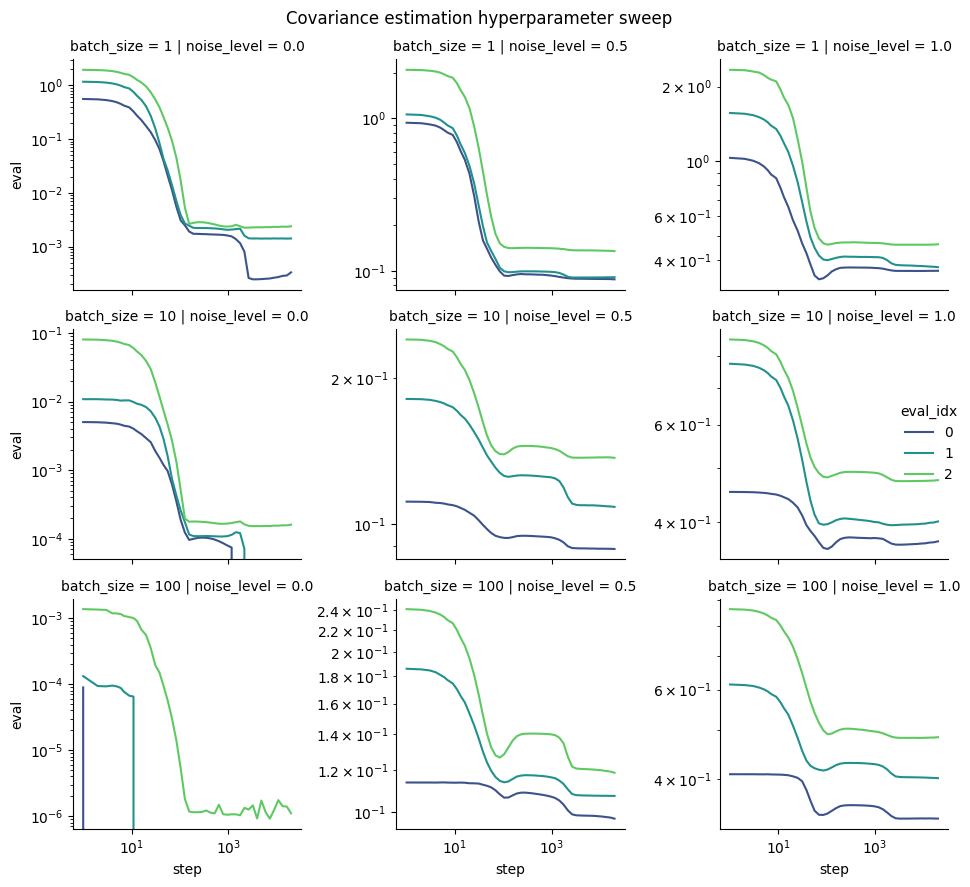

In [12]:
def plot_covariance_estimation_hyperparam_sweep(observations_df, y="eval", row="batch_size", col="noise_level", hue="eval_idx"):
    fig = plt.figure(figsize=(15, 6))

    g = sns.FacetGrid(observations_df, col=col, row=row, hue=hue, palette="viridis", sharey=False)
    g.map_dataframe(sns.lineplot, x="step", y=y)
    g.add_legend()
    g.set(xscale="log", yscale="log")
    # g.set(xscale="log", yscale="linear")

    plt.suptitle("Covariance estimation hyperparameter sweep")
    g.fig.tight_layout()
    plt.show()

covariance_estimation_sweep_df
plot_covariance_estimation_hyperparam_sweep(covariance_estimation_sweep_df)
# plot_covariance_estimation_hyperparam_sweep(covariance_estimation_sweep_df, y="true_eval")

#### Calibrating Burn-in Period

We'll want to use a burn-in period to avoid including the initial transient in our analysis. We'll want to use a burn-in period that's long enough to ensure that the weights have diverged from their initial values (and thus that there is any meaningful covariance to analyze).

To avoid having to repeat the covariance analysis for a bunch of different burn-in periods, we'll follow an online approach where we compute a novel covariance estimate for increasing numbers of sampling time steps.

In [13]:
# Let's try to understand the dependence of the covariance analysis on the number of burnin steps

NUM_STEPS_BW_DRAWS_COV = 5

class OnlineCovarianceAccumulator(SamplerCallback):
    """
    A callback to iteratively compute and store the covariance matrix of model weights.
    For use with `estimate`. 

    Attributes:
        num_weights (int): Total number of weights.
        first_moment (torch.Tensor): First moment of weights.
        second_moment (torch.Tensor): Second moment of weights.
        num_draws (int): Number of draws made to accumulate moments.
        accessors (List[WeightAccessor]): Functions to access model weights.
        num_evals (int): Number of eigenvalues to compute.
    """
    def __init__(self, num_draws_per_chain: int, num_chains: int, num_weights: int, accessors: List[WeightAccessor], device = "cpu", num_evals=3):
        """
        Initialize the accumulator.
        """        
        self.num_weights = num_weights
        self.first_moment = torch.zeros(num_draws_per_chain, num_weights, device=device)
        self.second_moment = torch.zeros(num_draws_per_chain, num_weights, num_weights, device=device)
        self.num_draws_per_chain = num_draws_per_chain
        self.num_chains = num_chains
        self.accessors = accessors
        self.num_evals = num_evals
        self.is_finished = False

    def accumulate(self, model: nn.Module, draw: int):
        """Accumulate moments from model weights."""
        assert not self.is_finished, "Cannot accumulate after finalizing."

        weights = torch.cat([accessor(model).view((-1,)) for accessor in self.accessors])
        self.first_moment[draw] += weights / self.num_chains
        self.second_moment[draw] += torch.outer(weights, weights) / (self.num_chains - 1)
        # print(self.first_moment.mean(), self.second_moment.mean())

    def finalize(self):
        """Finalize the moments by dividing by the number of draws."""
        self.is_finished = True

    def reset(self):
        """Reset the accumulator."""
        self.first_moment.zero_()
        self.second_moment.zero_()
        self.is_finished = False

    def to_matrix(self):
        """Convert the moments to a covariance matrix."""
        covariance = self.second_moment

        for d in range(self.num_draws_per_chain):
            first_moment = self.first_moment[d]
            covariance[d] -= (self.num_chains / (self.num_chains - 1)) * torch.outer(first_moment, first_moment)

        return covariance
    
    def to_eigen(self, include_matrix=False):
        """Convert the covariance matrix to pairs of eigenvalues and vectors."""
        cov = self.to_matrix().detach().cpu().numpy()

        evals = np.zeros((self.num_evals, self.num_draws_per_chain))
        evecs = np.zeros((self.num_evals, self.num_draws_per_chain, self.num_weights))

        for d in range(self.num_draws_per_chain):
            _evals, _evecs = eigsh(cov[d], k=self.num_evals, which='LM')
            evals[:, d], evecs[:, d, :] = _evals, _evecs.T

        results = {
            "evals": evals,
            "evecs": evecs
        }

        if include_matrix:
            results["matrix"] = cov

        return results

    def sample(self):
        return self.to_eigen(include_matrix=True)
        
    def __call__(self, model, draw):
        self.accumulate(model, draw)


def sweep_online_covariance_estimation_hyperparams(
        model, 
        dataset, 
        steps, 
        checkpoints, 
        grid: dict,
        device=DEVICE, 
        sgld_kwargs=None,
        loader_kwargs=None,
        sampling_kwargs=None,
):
    observations = []
    accessors = {
        "weight": lambda model: model.embedding.weight,
        "bias": lambda model: model.unembedding.bias,
    }
    num_weights = sum([v(model).numel() for v in accessors.values()])
    hyperparam_combos = list(itertools.product(*grid.values()))

    sgld_kwargs = sgld_kwargs or {}
    sgld_kwargs.setdefault("noise_level", 1.)
    sgld_kwargs.setdefault("num_samples", len(dataset))
    sgld_kwargs.setdefault("elasticity", 0.)
    sgld_kwargs.setdefault("lr", 0.01)

    loader_kwargs = loader_kwargs or {"batch_size": 100}

    sampling_kwargs = sampling_kwargs or {}
    sampling_kwargs.setdefault("num_draws", NUM_DRAWS_COV)
    sampling_kwargs.setdefault("num_chains", NUM_CHAINS_COV)
    sampling_kwargs.setdefault("num_burnin_steps", NUM_BURNIN_COV)
    sampling_kwargs.setdefault("num_steps_bw_draws", NUM_STEPS_BW_DRAWS_COV)
    

    for i, hyperparam_values in tqdm(enumerate(hyperparam_combos), total=len(hyperparam_combos), desc="Sweeping hyperparameters"):
        torch.manual_seed(i)
        hyperparams = dict(zip(grid.keys(), hyperparam_values))

        _sgld_kwargs = sgld_kwargs.copy()    
        _loader_kwargs = loader_kwargs.copy()
        _sampling_kwargs = sampling_kwargs.copy()

        for key in hyperparams:
            if key in _sgld_kwargs:
                _sgld_kwargs[key] = hyperparams[key]
            elif key in _loader_kwargs:
                _loader_kwargs[key] = hyperparams[key]
            elif key in _sampling_kwargs:
                _sampling_kwargs[key] = hyperparams[key]
            else:
                raise ValueError(f"Unknown hyperparameter {key}")

        loader = DataLoader(dataset, shuffle=True, **_loader_kwargs)
        
        callbacks = [
            OnlineCovarianceAccumulator(_sampling_kwargs["num_draws"], _sampling_kwargs["num_chains"], num_weights, list(accessors.values()), device=device),
        ]

        for step, checkpoint in tqdm(zip(steps, checkpoints), desc="Sweeping checkpoints", total=len(steps)):
            model.load_state_dict({k: torch.Tensor(v) for k, v in checkpoint.items()})

            observation = estimate_learning_coeff_with_summary(
                model,
                loader,
                F.mse_loss,
                device=device, # type: ignore
                sampling_method=SGLD,
                optimizer_kwargs=_sgld_kwargs,
                verbose=False,
                callbacks=callbacks,
                seed=i * _sampling_kwargs["num_chains"],
                **_sampling_kwargs
            )

            evals, _, _ = observation.pop("evals"), observation.pop("evecs"), observation.pop("matrix")

            for draw in range(_sampling_kwargs["num_draws"]):
                for j, eval in enumerate(evals[:, draw]):
                    observations.append({
                        "step": step,
                        "eval": eval,
                        "eval_idx": j,
                        "draw_idx": draw,
                        **observation,
                        **_loader_kwargs,
                        **_sgld_kwargs,
                        **_sampling_kwargs,
                    })

            for callback in callbacks:
                callback.reset()

    observations_df = pd.DataFrame(observations)
    return observations_df

model = ToyAutoencoder(NUM_FEATURES, NUM_HIDDEN_UNITS, final_bias=True)
online_covariance_estimation_sweep_df = sweep_online_covariance_estimation_hyperparams(
    model, dataset_double, STEPS, weights,
    loader_kwargs={"batch_size": 10},
    sampling_kwargs={"num_burnin_steps": 0, "num_steps_bw_draws": 5},
    grid={"num_draws": [10], "num_chains": [5, 10, 20, 50, 100]}
)
online_covariance_estimation_sweep_df


Sweeping hyperparameters: 100%|██████████| 5/5 [07:54<00:00, 94.98s/it] 


,step,eval,eval_idx,draw_idx,llc/mean,llc/std,llc-chain/0,llc-chain/1,llc-chain/2,llc-chain/3,...,llc-chain/90,llc-chain/91,llc-chain/92,llc-chain/93,llc-chain/94,llc-chain/95,llc-chain/96,llc-chain/97,llc-chain/98,llc-chain/99
0,1,0.073095,0,0,-2177.971680,13.417324,-2168.326172,-2172.405518,-2177.248047,-2201.246094,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,0.128005,1,0,-2177.971680,13.417324,-2168.326172,-2172.405518,-2177.248047,-2201.246094,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,0.194024,2,0,-2177.971680,13.417324,-2168.326172,-2172.405518,-2177.248047,-2201.246094,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,0.333930,0,1,-2177.971680,13.417324,-2168.326172,-2172.405518,-2177.248047,-2201.246094,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,0.587315,1,1,-2177.971680,13.417324,-2168.326172,-2172.405518,-2177.248047,-2201.246094,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6895,20000,0.920079,1,8,4.926495,1.714300,5.018530,7.032173,4.057775,6.231333,...,5.313437,3.961682,5.130555,5.755257,5.478171,6.0036,4.514667,5.224977,7.844135,4.476048
6896,20000,1.028660,2,8,4.926495,1.714300,5.018530,7.032173,4.057775,6.231333,...,5.313437,3.961682,5.130555,5.755257,5.478171,6.0036,4.514667,5.224977,7.844135,4.476048
6897,20000,0.899575,0,9,4.926495,1.714300,5.018530,7.032173,4.057775,6.231333,...,5.313437,3.961682,5.130555,5.755257,5.478171,6.0036,4.514667,5.224977,7.844135,4.476048
6898,20000,1.037247,1,9,4.926495,1.714300,5.018530,7.032173,4.057775,6.231333,...,5.313437,3.961682,5.130555,5.755257,5.478171,6.0036,4.514667,5.224977,7.844135,4.476048


<Figure size 1500x600 with 0 Axes>

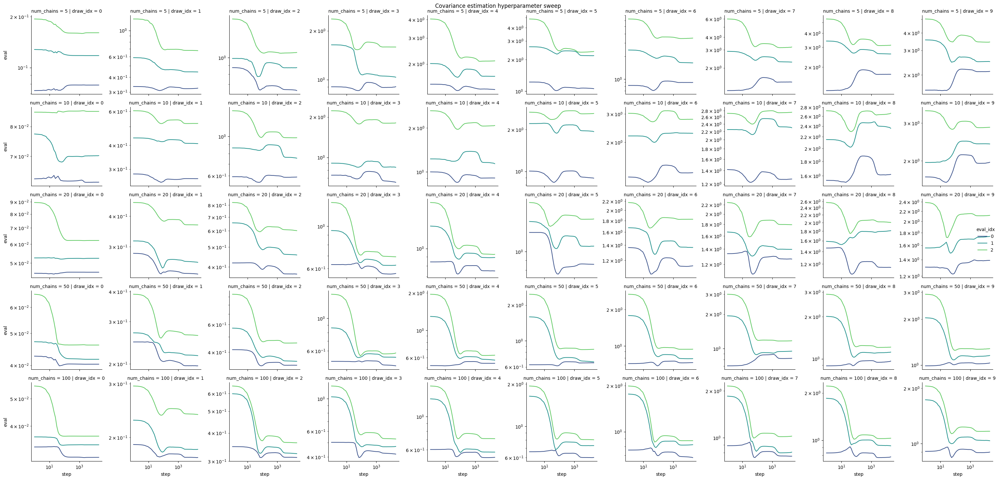

In [14]:
plot_covariance_estimation_hyperparam_sweep(online_covariance_estimation_sweep_df, col="draw_idx", row="num_chains")